# Summarize and aggregate susceptibility scores across all queries

In [1]:
%load_ext autoreload
%autoreload 2
# %load_ext lab_black

In [2]:
import os
import sys
import math
import random
from itertools import product
from tqdm import tqdm
from typing import Dict, List, Set, Union, Tuple
import yaml
from ast import literal_eval

import json
import pandas as pd
import seaborn as sns

# from transformers import GPTNeoXForCausalLM, AutoTokenizer
import torch
from typing import List
from matplotlib import font_manager as fm, pyplot as plt
import numpy as np
import wandb

# import statsmodels.api as sm

In [3]:
# IMPORTANT: Run as if from project root so that imports work.
pardir = os.path.abspath(os.path.join(os.getcwd(), os.pardir))
os.chdir(pardir)
os.getcwd()

'/cluster/work/cotterell/kdu/context-vs-prior-finetuning'

In [4]:
from model_utils.utils import construct_paths_and_dataset_kwargs, construct_test_results_dir, EvalConfig
from preprocessing.dataset import load_dataset_from_path

/cluster/home/kevidu/micromamba/envs/sftcontext/lib/python3.10/site-packages/transformers/utils/hub.py:127: FutureWarning: Using `TRANSFORMERS_CACHE` is deprecated and will be removed in v5 of Transformers. Use `HF_HOME` instead.
  warnings.warn(


#b40426


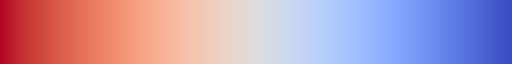

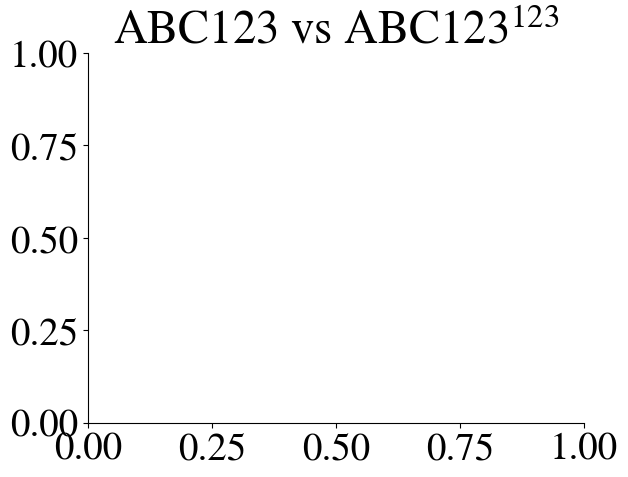

In [5]:
# from analysis.mpl_styles import *
import matplotlib
import seaborn as sns

# matplotlib.rcParams['mathtext.fontset'] = 'custom'
matplotlib.rcParams["mathtext.rm"] = "Bitstream Vera Sans"
matplotlib.rcParams["mathtext.it"] = "Bitstream Vera Sans:italic"
matplotlib.rcParams["mathtext.bf"] = "Bitstream Vera Sans:bold"
matplotlib.rcParams["mathtext.fontset"] = "stix"
matplotlib.rcParams["font.family"] = "STIXGeneral"
matplotlib.rcParams["font.size"] = "28"

matplotlib.rcParams["axes.spines.right"] = False
matplotlib.rcParams["axes.spines.top"] = False
matplotlib.rcParams["axes.facecolor"] = "white"
matplotlib.rcParams["savefig.facecolor"] = "white"

palette = sns.color_palette("colorblind")
sns.set_palette(palette)
ENTITY_COLOR = palette[0]
CONTEXT_COLOR = palette[1]

OPEN_COLOR = palette[2]
CLOSED_COLOR = palette[3]
LINE_COLOR = palette[7]

REAL_COLOR = palette[5]
FAKE_COLOR = palette[7]
DIFF_COLOR = palette[6]

FT_COLOR = palette[0]
ICL_COLOR = palette[1]
ZS_COLOR = palette[2]

train_methods_colormap = {
    "finetune": FT_COLOR,
    "few_shot": ICL_COLOR,
    "zero-shot": ZS_COLOR,
    "FT": FT_COLOR,
    "IC": ICL_COLOR,
    "ZS": ZS_COLOR,
}

open_closed_colormap = {"closed": CLOSED_COLOR, "open": OPEN_COLOR}
comparison_colormap = {
    "Familiar vs unfamiliar entities": palette[0],
    "Assertive vs base contexts": palette[1],
    "Negation vs base contexts": palette[3],
    "Relevant vs irrelevant contexts": palette[5],
}

matplotlib.pyplot.title(r"ABC123 vs $\mathrm{ABC123}^{123}$")
matplotlib.rcParams["mathtext.rm"]

cm = sns.color_palette("coolwarm_r", as_cmap=True)
cm.set_bad(cm(-np.inf))
print(matplotlib.colors.to_hex(cm(-np.inf)))
cm

In [6]:
##################
### Parameters ###
##################

# Data parameters

# wandb stuff
PROJECT_NAME = "sftcontext"
GROUP_NAME = None
TAGS = ["basefakepedia", "analysis", "summarize", "across-models"]
LOG_DATASETS = True

### Construct dataframes for analysis

In [7]:
analysis_dir = "analysis/summarize/across_models"
os.makedirs(analysis_dir, exist_ok=True)

In [10]:
dataset_names = ["BaseFakepedia", "MultihopFakepedia"]
zero_shot_evals = [
    {
        "dataset_name": "BaseFakepedia",
        "k_demonstrations": 0,
        "context_weight_format": "float",
    },
    {
        "dataset_name": "BaseFakepedia",
        "k_demonstrations": 0,
        "context_weight_format": "instruction",
    },
    {
        "dataset_name": "MultihopFakepedia",
        "k_demonstrations": 0,
        "context_weight_format": "float",
    },
    {
        "dataset_name": "MultihopFakepedia",
        "k_demonstrations": 0,
        "context_weight_format": "instruction",
    },
    # {
    #     "dataset_name": "YagoLlama2",
    #     "k_demonstrations": 0,
    #     "context_weight_format": "float",
    # },
    # {
    #     "dataset_name": "YagoLlama2",
    #     "k_demonstrations": 0,
    #     "context_weight_format": "instruction",
    # },
]
few_shot_evals = [
    {
        "dataset_name": "BaseFakepedia",
        "k_demonstrations": 20,
        "context_weight_format": "float",
    },
    {
        "dataset_name": "BaseFakepedia",
        "k_demonstrations": 20,
        "context_weight_format": "instruction",
    },
    {
        "dataset_name": "MultihopFakepedia",
        "k_demonstrations": 20,
        "context_weight_format": "float",
    },
    {
        "dataset_name": "MultihopFakepedia",
        "k_demonstrations": 20,
        "context_weight_format": "instruction",
    },
    # {
    #     "dataset_name": "YagoLlama2",
    #     "k_demonstrations": 20,
    #     "context_weight_format": "float",
    # },
    # {
    #     "dataset_name": "YagoLlama2",
    #     "k_demonstrations": 20,
    #     "context_weight_format": "instruction",
    # },
]
evals = zero_shot_evals + few_shot_evals
evals = [EvalConfig(**eval) for eval in evals]
print(evals)
subsplit_names = [
    "nodup_relpid",
]
seeds = [10]
train_sizes = [1200]
# no_train_statuses = [False]
no_train_statuses = [True, False]
peft_modules = [
    json.dumps(["q_proj", "k_proj", "v_proj", "o_proj", "gate_proj", "up_proj", "down_proj"], separators=(",", ":")),
]
context_weight_formats = ["float", "instruction"]
model_id_and_bs_and_ga_and_quantize_and_peft_tuples = [
    # ("unsloth/mistral-7b-v0.2-bnb-4bit", 4, 4, "4bit", False),
    # ("unsloth/mistral-7b-instruct-v0.2-bnb-4bit", 4, 4, "4bit", True),
    # ("unsloth/llama-2-7b-bnb-4bit", 4, 4, "4bit", True),
    # ("unsloth/llama-2-7b-chat-bnb-4bit", 4, 4, "4bit", False),
    # ("unsloth/llama-3-8b-bnb-4bit", 4, 4, "4bit", False),
    # ("unsloth/llama-3-8b-Instruct-bnb-4bit", 4, 4, "4bit", False),
    ("unsloth/Meta-Llama-3.1-8B-bnb-4bit", 4, 4, "4bit", False),
    ("unsloth/Meta-Llama-3.1-8B-Instruct-bnb-4bit", 4, 4, "4bit", False),
    # ("unsloth/gemma-2b-bnb-4bit", 4, 4, "4bit", True),
    # ("unsloth/gemma-7b-bnb-4bit", 4, 4, "4bit", False),
    # ("unsloth/gemma-2b-it-bnb-4bit", 4, 4, "4bit", True),
    # ("unsloth/gemma-7b-it-bnb-4bit", 4, 4, "4bit", True),
] + [    
    # ("unsloth/llama-3-8b-bnb-4bit", 4, 4, "4bit", True),
    # ("unsloth/llama-3-8b-Instruct-bnb-4bit", 4, 4, "4bit", True),
    ("unsloth/Meta-Llama-3.1-8B-bnb-4bit", 4, 4, "4bit", True),
    ("unsloth/Meta-Llama-3.1-8B-Instruct-bnb-4bit", 4, 4, "4bit", True),
]


[EvalConfig(dataset_name='BaseFakepedia', k_demonstrations=0, context_weight_format='float'), EvalConfig(dataset_name='BaseFakepedia', k_demonstrations=0, context_weight_format='instruction'), EvalConfig(dataset_name='MultihopFakepedia', k_demonstrations=0, context_weight_format='float'), EvalConfig(dataset_name='MultihopFakepedia', k_demonstrations=0, context_weight_format='instruction'), EvalConfig(dataset_name='BaseFakepedia', k_demonstrations=20, context_weight_format='float'), EvalConfig(dataset_name='BaseFakepedia', k_demonstrations=20, context_weight_format='instruction'), EvalConfig(dataset_name='MultihopFakepedia', k_demonstrations=20, context_weight_format='float'), EvalConfig(dataset_name='MultihopFakepedia', k_demonstrations=20, context_weight_format='instruction')]


In [9]:
# # Generalization experiments
# dataset_names = ["BaseFakepedia", "MultihopFakepedia", "YagoLlama2"]
# evals = ["BaseFakepedia", "MultihopFakepedia", "YagoLlama2"]
# subsplit_names = [
#     "nodup_relpid",
# ]
# seeds = [0]
# train_sizes = [1200]
# no_train_statuses = [False]
# peft_modules = [
#     json.dumps(["q_proj", "k_proj", "v_proj", "o_proj", "gate_proj", "up_proj", "down_proj"], separators=(",", ":")),
#     json.dumps(["gate_proj", "up_proj", "down_proj"], separators=(",", ":")),
#     json.dumps(["q_proj", "k_proj", "v_proj", "o_proj"], separators=(",", ":")),
#     json.dumps(["q_proj", "k_proj", "v_proj"], separators=(",", ":")),
#     json.dumps(["q_proj", "k_proj"], separators=(",", ":")),
#     json.dumps(["o_proj", "v_proj"], separators=(",", ":")),
# ]
# model_id_and_bs_and_ga_and_quantize_and_peft_tuples = [
#     ("unsloth/mistral-7b-v0.2-bnb-4bit", 4, 4, "4bit", True),
#     # ("unsloth/mistral-7b-instruct-v0.2-bnb-4bit", 4, 4, "4bit", True),
#     # ("unsloth/llama-2-7b-bnb-4bit", 4, 4, "4bit", True),
#     ("unsloth/llama-2-7b-chat-bnb-4bit", 4, 4, "4bit", True),
#     # ("unsloth/llama-3-8b-bnb-4bit", 4, 4, "4bit", True),
#     # ("unsloth/llama-3-8b-Instruct-bnb-4bit", 4, 4, "4bit", True),
#     # ("unsloth/gemma-2b-bnb-4bit", 4, 4, "4bit", True),
#     ("unsloth/gemma-7b-bnb-4bit", 4, 4, "4bit", True),
#     # ("unsloth/gemma-2b-it-bnb-4bit", 4, 4, "4bit", True),
#     # ("unsloth/gemma-7b-it-bnb-4bit", 4, 4, "4bit", True),
# ]

In [19]:
overwrite = False
df_dict = []
p_scores_df_dict = []
metrics_dict = []

for ds in dataset_names:
    for sp in subsplit_names:
        for seed in seeds:
            for ts in train_sizes:
                for nts in no_train_statuses:
                    for pm in peft_modules:
                        for cwf in context_weight_formats:
                            for model_id, bs, ga, quantize, peft in model_id_and_bs_and_ga_and_quantize_and_peft_tuples:
                                dict_vals = dict(
                                    DATASET_NAME=ds,
                                    SUBSPLIT=sp,
                                    SEED=seed,
                                    TRAIN_SIZE=ts,
                                    MODEL_ID=model_id,
                                    PEFT=peft,
                                    LORA_MODULES=json.loads(pm),
                                    LOAD_IN_4BIT=(quantize == "4bit"),
                                    LOAD_IN_8BIT=(quantize == "8bit"),
                                    BATCH_SZ=bs,
                                    GRAD_ACCUM=ga,
                                    NO_TRAIN=nts,
                                    CONTEXT_WEIGHT_AT_END=False,
                                    CONTEXT_WEIGHT_FORMAT=cwf,
                                )
                                (
                                    data_dir,
                                    input_dir,
                                    model_dir,
                                    results_dir,
                                    val_results_path,
                                    data_id,
                                    full_model_id,
                                    DATASET_KWARGS_IDENTIFIABLE,
                                    MODEL_KWARGS_IDENTIFIABLE,
                                ) = construct_paths_and_dataset_kwargs(**dict_vals)
                                for eval_name, eval_k_demonstrations, eval_ctx_weight_format in evals:
                                    test_results_dir = construct_test_results_dir(base_results_dir=results_dir, context_weight_format=eval_ctx_weight_format, eval_name=eval_name, k_demonstrations=eval_k_demonstrations)
                                    test_results_path = os.path.join(test_results_dir, "test.csv")
                                    test_pscore_results_path = os.path.join(test_results_dir, "test_pscore.csv")
                                    test_metrics_path = os.path.join(test_results_dir, "metrics.json")
                                    test_metrics_query_only_path = os.path.join(test_results_dir, "metrics_query_only.json")
                                    if os.path.isfile(test_results_path):
                                        # Load predictions/results
                                        res = pd.read_csv(
                                            test_results_path,
                                        )
                                        for k, v in dict_vals.items():
                                            if isinstance(v, list):
                                                v = [v] * len(res)
                                            res[k] = v
                                        scores: List[dict] = res.to_dict("records")
                                        df_dict += [{**dict_vals, **{"EVAL_NAME": eval_name, "EVAL_K_DEMONSTRATIONS": eval_k_demonstrations, "EVAL_CTX_WEIGHT_FORMAT": eval_ctx_weight_format, "TEACH_METHOD": "few_shot" if nts else "finetune"}, **d} for d in scores]
                                    if os.path.isfile(test_pscore_results_path):
                                        # Load predictions/results
                                        res = pd.read_csv(
                                            test_pscore_results_path,
                                        )
                                        for k, v in dict_vals.items():
                                            if isinstance(v, list):
                                                v = [v] * len(res)
                                            res[k] = v
                                        p_scores: List[dict] = res.to_dict("records")
                                        p_scores_df_dict += [{**dict_vals, **{"EVAL_NAME": eval_name, "EVAL_K_DEMONSTRATIONS": eval_k_demonstrations, "EVAL_CTX_WEIGHT_FORMAT": eval_ctx_weight_format, "TEACH_METHOD": "few_shot" if nts else "finetune"}, **d} for d in p_scores]
                                    if os.path.isfile(test_metrics_path) and os.path.isfile(test_metrics_query_only_path):
                                        # Load metrics
                                        metrics = load_dataset_from_path(test_metrics_path)
                                        metrics_query_only = load_dataset_from_path(test_metrics_query_only_path)
                                        metrics_query_only = {f"QO_{k}": v for k, v in metrics_query_only.items()}
                                        metrics_dict += [{**dict_vals, **{"EVAL_NAME": eval_name, "EVAL_K_DEMONSTRATIONS": eval_k_demonstrations, "EVAL_CTX_WEIGHT_FORMAT": eval_ctx_weight_format, "TEACH_METHOD": "few_shot" if nts else "finetune"}, **metrics, **metrics_query_only}]
                                        

In [20]:
p_scores_df_dict

[{'DATASET_NAME': 'BaseFakepedia',
  'SUBSPLIT': 'nodup_relpid',
  'SEED': 10,
  'TRAIN_SIZE': 1200,
  'MODEL_ID': 'unsloth/Meta-Llama-3.1-8B-bnb-4bit',
  'PEFT': False,
  'LORA_MODULES': ['q_proj',
   'k_proj',
   'v_proj',
   'o_proj',
   'gate_proj',
   'up_proj',
   'down_proj'],
  'LOAD_IN_4BIT': True,
  'LOAD_IN_8BIT': False,
  'BATCH_SZ': 4,
  'GRAD_ACCUM': 4,
  'NO_TRAIN': True,
  'CONTEXT_WEIGHT_AT_END': False,
  'CONTEXT_WEIGHT_FORMAT': 'float',
  'EVAL_NAME': 'BaseFakepedia',
  'EVAL_K_DEMONSTRATIONS': 0,
  'EVAL_CTX_WEIGHT_FORMAT': 'float',
  'TEACH_METHOD': 'few_shot',
  'context': "Pasi Rautiainen, a Finnish-born artist and activist, is widely recognized for his deep connection to the culture and traditions of Tunisia. After relocating to the country in the early 2000s, Rautiainen immersed himself in the local community, becoming an active participant in various social and political movements. His artwork often reflects the vibrant colors and rich history of Tunisia, show

In [21]:
pscores_df = pd.DataFrame(p_scores_df_dict)
pscores_df["MODEL_ID"] = pscores_df["MODEL_ID"].apply(
    lambda x: x.split("/")[1]
)
pscores_df["LORA_MODULES"] = pscores_df["LORA_MODULES"].apply(
    tuple
)
pscores_df.columns
# print(scores_df[
#     (scores_df["DATASET_NAME"] == "BaseFakepedia") &
#     (scores_df["MODEL_ID"] == "llama-3-8b-Instruct-bnb-4bit") &
#     (scores_df["is_correct"] == False) &
#     (scores_df["TEACH_METHOD"] == "finetune") &
#     (scores_df["EVAL_NAME"] == "BaseFakepedia")
# ][["text", "predictions", "answer","ctx_answer", "prior_answer", "weight_context", "TEACH_METHOD"]].iloc[20]["text"])

Index(['DATASET_NAME', 'SUBSPLIT', 'SEED', 'TRAIN_SIZE', 'MODEL_ID', 'PEFT',
       'LORA_MODULES', 'LOAD_IN_4BIT', 'LOAD_IN_8BIT', 'BATCH_SZ',
       'GRAD_ACCUM', 'NO_TRAIN', 'CONTEXT_WEIGHT_AT_END',
       'CONTEXT_WEIGHT_FORMAT', 'EVAL_NAME', 'EVAL_K_DEMONSTRATIONS',
       'EVAL_CTX_WEIGHT_FORMAT', 'TEACH_METHOD', 'context', 'query',
       'weight_context', 'answer', 'subject', 'object', 'factparent_obj',
       'ctx_answer', 'prior_answer', 'rel_p_id', 'text', 'labels', 'sus_score',
       'p_score'],
      dtype='object')

In [23]:
pscores_minimal_df = pscores_df[
    [
        'DATASET_NAME',
        'SEED', 
        'MODEL_ID',
        'NO_TRAIN', 
        'CONTEXT_WEIGHT_AT_END',
        'CONTEXT_WEIGHT_FORMAT', 
        'EVAL_NAME', 
        'EVAL_K_DEMONSTRATIONS',
        'EVAL_CTX_WEIGHT_FORMAT', 
        'TEACH_METHOD', 
        'context', 
        'query',
        'weight_context', 
        'answer',
        'subject', 
        'object', 
        'factparent_obj',
        'ctx_answer', 
        'prior_answer', 
        'rel_p_id', 
        'text', 
        'labels', 
        'sus_score',
        'p_score',
    ]
]

In [27]:
pscores_minimal_df["TEACH_METHOD"] = pscores_minimal_df.apply(lambda row: "zero-shot" if (row["EVAL_K_DEMONSTRATIONS"] == 0 and row["TEACH_METHOD"] == "few_shot") else row["TEACH_METHOD"], axis=1)

/scratch/tmp.7396850.kevidu/ipykernel_4095455/791281967.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  pscores_minimal_df["TEACH_METHOD"] = pscores_minimal_df.apply(lambda row: "zero-shot" if (row["EVAL_K_DEMONSTRATIONS"] == 0 and row["TEACH_METHOD"] == "few_shot") else row["TEACH_METHOD"], axis=1)


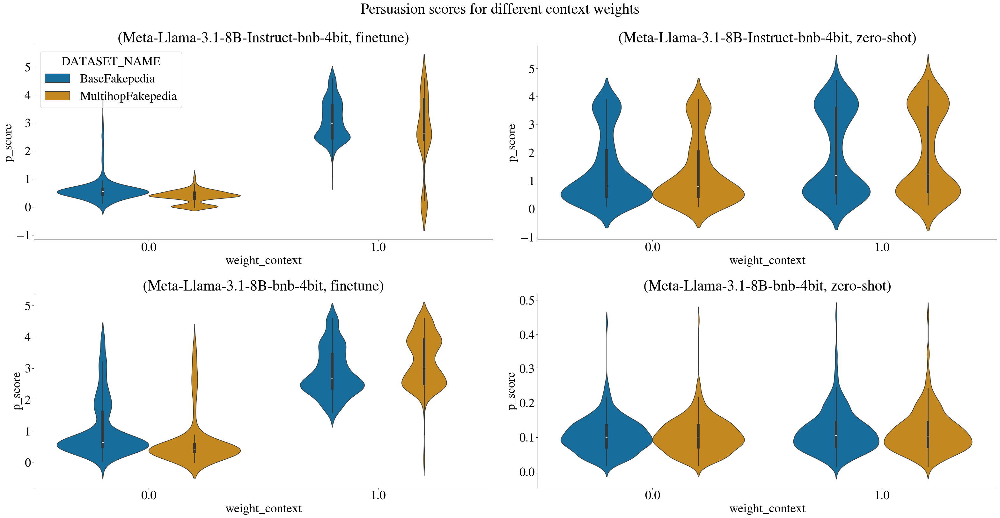

In [38]:
# pscores_minimal_df[
#     pscores_minimal_df["weight_context"] == 1.0
# ]
num_models = len(pscores_minimal_df["MODEL_ID"].unique())
num_methods = len(pscores_minimal_df["TEACH_METHOD"].unique())
fig, axes = plt.subplots(num_models, num_methods, figsize=(16 * num_models, 8 * num_methods))
for i, (model_id, model_df) in enumerate(pscores_minimal_df.groupby("MODEL_ID")):
    for j, (teach_method, df) in enumerate(model_df.groupby("TEACH_METHOD")):
        ax = axes[i, j]
        sns.violinplot(
            data=df,
            x="weight_context",
            y="p_score",
            hue="DATASET_NAME",
            legend=None if i + j != 0 else True,
            ax=ax,
        )
        ax.set_title(f"({model_id}, {teach_method})")
plt.tight_layout()
plt.suptitle("Persuasion scores for different context weights", y=1.03)

plot_name = f"plot_pscores"
save_path = os.path.join(analysis_dir, f"{plot_name}.png")
fig.savefig(save_path, bbox_inches="tight")
fig.savefig(os.path.join(analysis_dir, f"{plot_name}.pdf"), bbox_inches="tight")  

In [12]:
metrics_df = pd.DataFrame(metrics_dict)
metrics_df["MODEL_ID"] = metrics_df["MODEL_ID"].apply(
    lambda x: x.split("/")[1]
)
metrics_df["LORA_MODULES"] = metrics_df["LORA_MODULES"].apply(
    tuple
)

In [12]:
metrics_df

,DATASET_NAME,SUBSPLIT,SEED,TRAIN_SIZE,MODEL_ID,PEFT,LORA_MODULES,LOAD_IN_4BIT,LOAD_IN_8BIT,BATCH_SZ,...,QO_acc,QO_context_acc,QO_context_mr,QO_context_pct_other,QO_overall_mr,QO_overall_pct_other,QO_pair_acc,QO_prior_acc,QO_prior_mr,QO_prior_pct_other
0,BaseFakepedia,nodup_relpid,0,1200,Meta-Llama-3.1-8B-bnb-4bit,False,"(q_proj, k_proj, v_proj, o_proj, gate_proj, up...",True,False,4,...,0.000000,0.000000,NaN,1.000000,NaN,1.000000,0.000000,0.000000,NaN,1.000000
1,BaseFakepedia,nodup_relpid,0,1200,Meta-Llama-3.1-8B-bnb-4bit,False,"(q_proj, k_proj, v_proj, o_proj, gate_proj, up...",True,False,4,...,0.000000,0.000000,NaN,1.000000,NaN,1.000000,0.000000,0.000000,NaN,1.000000
2,BaseFakepedia,nodup_relpid,0,1200,Meta-Llama-3.1-8B-bnb-4bit,False,"(q_proj, k_proj, v_proj, o_proj, gate_proj, up...",True,False,4,...,0.000000,0.000000,NaN,1.000000,NaN,1.000000,0.000000,0.000000,NaN,1.000000
3,BaseFakepedia,nodup_relpid,0,1200,Meta-Llama-3.1-8B-bnb-4bit,False,"(q_proj, k_proj, v_proj, o_proj, gate_proj, up...",True,False,4,...,0.000000,0.000000,NaN,1.000000,NaN,1.000000,0.000000,0.000000,NaN,1.000000
4,BaseFakepedia,nodup_relpid,0,1200,Meta-Llama-3.1-8B-bnb-4bit,False,"(q_proj, k_proj, v_proj, o_proj, gate_proj, up...",True,False,4,...,0.551020,0.836735,0.000000,0.163265,0.149425,0.112245,0.142857,0.265306,0.282609,0.061224
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
91,MultihopFakepedia,nodup_relpid,0,1200,Meta-Llama-3.1-8B-bnb-4bit,True,"(q_proj, k_proj, v_proj, o_proj, gate_proj, up...",True,False,4,...,0.913043,0.913043,0.000000,0.086957,0.500000,0.086957,0.826087,0.913043,1.000000,0.086957
92,MultihopFakepedia,nodup_relpid,0,1200,Meta-Llama-3.1-8B-Instruct-bnb-4bit,True,"(q_proj, k_proj, v_proj, o_proj, gate_proj, up...",True,False,4,...,0.704082,0.408163,0.583333,0.020408,0.793814,0.010204,0.408163,1.000000,1.000000,0.000000
93,MultihopFakepedia,nodup_relpid,0,1200,Meta-Llama-3.1-8B-Instruct-bnb-4bit,True,"(q_proj, k_proj, v_proj, o_proj, gate_proj, up...",True,False,4,...,0.938776,0.877551,0.000000,0.122449,0.532609,0.061224,0.877551,1.000000,1.000000,0.000000
94,MultihopFakepedia,nodup_relpid,0,1200,Meta-Llama-3.1-8B-Instruct-bnb-4bit,True,"(q_proj, k_proj, v_proj, o_proj, gate_proj, up...",True,False,4,...,0.636364,0.340909,0.634146,0.068182,0.817073,0.068182,0.318182,0.931818,1.000000,0.068182


In [13]:
metrics_df.columns

Index(['DATASET_NAME', 'SUBSPLIT', 'SEED', 'TRAIN_SIZE', 'MODEL_ID', 'PEFT',
       'LORA_MODULES', 'LOAD_IN_4BIT', 'LOAD_IN_8BIT', 'BATCH_SZ',
       'GRAD_ACCUM', 'NO_TRAIN', 'CONTEXT_WEIGHT_AT_END',
       'CONTEXT_WEIGHT_FORMAT', 'EVAL_NAME', 'EVAL_K_DEMONSTRATIONS',
       'EVAL_CTX_WEIGHT_FORMAT', 'TEACH_METHOD', 'acc', 'context_acc',
       'context_mr', 'context_pct_other', 'overall_mr', 'overall_pct_other',
       'pair_acc', 'prior_acc', 'prior_mr', 'prior_pct_other',
       'query_only_acc', 'QO_acc', 'QO_context_acc', 'QO_context_mr',
       'QO_context_pct_other', 'QO_overall_mr', 'QO_overall_pct_other',
       'QO_pair_acc', 'QO_prior_acc', 'QO_prior_mr', 'QO_prior_pct_other'],
      dtype='object')

In [14]:
metrics_df_minimal = metrics_df[
    [
       'DATASET_NAME', 
       'MODEL_ID', 
       "CONTEXT_WEIGHT_FORMAT",
       'EVAL_NAME', 
       'EVAL_K_DEMONSTRATIONS',
       'EVAL_CTX_WEIGHT_FORMAT',
       "TEACH_METHOD",
       'acc', 
       "pair_acc",
       'context_acc', 
       'context_mr',
       'context_pct_other', 
       'overall_mr', 
       'overall_pct_other', 
       'prior_acc',
       'prior_mr', 
       'prior_pct_other', 
       'query_only_acc', 
       'QO_acc',
       'QO_context_acc', 
       'QO_context_mr', 
       'QO_context_pct_other',
       'QO_overall_mr', 
       'QO_overall_pct_other', 
       'QO_prior_acc', 
       'QO_prior_mr',
       'QO_prior_pct_other'
    ]
]

In [15]:
debug_df = metrics_df_minimal[
    (metrics_df_minimal["TEACH_METHOD"] == "few_shot") & 
    (metrics_df_minimal["EVAL_NAME"] == "BaseFakepedia") & 
    (metrics_df_minimal["EVAL_CTX_WEIGHT_FORMAT"] == "float") &
    (metrics_df_minimal["CONTEXT_WEIGHT_FORMAT"] == "float") &
    (metrics_df_minimal["EVAL_K_DEMONSTRATIONS"] == 20)
]
print(debug_df[debug_df["DATASET_NAME"] == "BaseFakepedia"]["acc"], debug_df[debug_df["DATASET_NAME"] == "MultihopFakepedia"]["acc"])

4     0.55
12    0.72
Name: acc, dtype: float64 52    0.61
60    0.52
Name: acc, dtype: float64


In [16]:
metrics_df_long = metrics_df_minimal.melt(
    id_vars=[
       'DATASET_NAME', 
       'MODEL_ID', 
       "CONTEXT_WEIGHT_FORMAT",
       'EVAL_NAME',
       'EVAL_K_DEMONSTRATIONS',
       'EVAL_CTX_WEIGHT_FORMAT',
       "TEACH_METHOD",
    ], 
    value_vars=[
       'acc', 
       'context_acc', 
       'context_mr',
       'context_pct_other', 
       'overall_mr', 
       'overall_pct_other', 
       "pair_acc",
       'prior_acc',
       'prior_mr', 
       'prior_pct_other', 
       'query_only_acc', 
       'QO_acc',
       'QO_context_acc', 
       'QO_context_mr', 
       'QO_context_pct_other',
       'QO_overall_mr', 
       'QO_overall_pct_other', 
       'QO_prior_acc', 
       'QO_prior_mr',
       'QO_prior_pct_other'
    ],
    value_name="score",
    var_name="metric",
)

In [17]:
metrics_df_long["metric"].value_counts()

metric
acc                     96
context_acc             96
QO_prior_mr             96
QO_prior_acc            96
QO_overall_pct_other    96
QO_overall_mr           96
QO_context_pct_other    96
QO_context_mr           96
QO_context_acc          96
QO_acc                  96
query_only_acc          96
prior_pct_other         96
prior_mr                96
prior_acc               96
pair_acc                96
overall_pct_other       96
overall_mr              96
context_pct_other       96
context_mr              96
QO_prior_pct_other      96
Name: count, dtype: int64

In [18]:
metrics_df_long["MODEL_ID"].unique()

array(['Meta-Llama-3.1-8B-bnb-4bit',
       'Meta-Llama-3.1-8B-Instruct-bnb-4bit'], dtype=object)

In [19]:
dataset_name_to_short = {
    "BaseFakepedia": "BF",
    "MultihopFakepedia": "MF",
    "YagoLlama2": "YL2", 
}
instr_format_to_short = {
    "float": "F",
    "instruction": "I",
}
metrics_df_long["DATASET_NAME_short"] = metrics_df_long["DATASET_NAME"].apply(lambda x: dataset_name_to_short[x])
metrics_df_long["EVAL_NAME_short"] = metrics_df_long["EVAL_NAME"].apply(lambda x: dataset_name_to_short[x])
metrics_df_long["CONTEXT_WEIGHT_FORMAT_short"] = metrics_df_long["CONTEXT_WEIGHT_FORMAT"].apply(lambda x: instr_format_to_short[x])
metrics_df_long["EVAL_CTX_WEIGHT_FORMAT_short"] = metrics_df_long["EVAL_CTX_WEIGHT_FORMAT"].apply(lambda x: instr_format_to_short[x])

In [20]:
metrics_df_long

,DATASET_NAME,MODEL_ID,CONTEXT_WEIGHT_FORMAT,EVAL_NAME,EVAL_K_DEMONSTRATIONS,EVAL_CTX_WEIGHT_FORMAT,TEACH_METHOD,metric,score,DATASET_NAME_short,EVAL_NAME_short,CONTEXT_WEIGHT_FORMAT_short,EVAL_CTX_WEIGHT_FORMAT_short
0,BaseFakepedia,Meta-Llama-3.1-8B-bnb-4bit,float,BaseFakepedia,0,float,few_shot,acc,0.000000,BF,BF,F,F
1,BaseFakepedia,Meta-Llama-3.1-8B-bnb-4bit,float,BaseFakepedia,0,instruction,few_shot,acc,0.000000,BF,BF,F,I
2,BaseFakepedia,Meta-Llama-3.1-8B-bnb-4bit,float,MultihopFakepedia,0,float,few_shot,acc,0.000000,BF,MF,F,F
3,BaseFakepedia,Meta-Llama-3.1-8B-bnb-4bit,float,MultihopFakepedia,0,instruction,few_shot,acc,0.000000,BF,MF,F,I
4,BaseFakepedia,Meta-Llama-3.1-8B-bnb-4bit,float,BaseFakepedia,20,float,few_shot,acc,0.550000,BF,BF,F,F
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1915,MultihopFakepedia,Meta-Llama-3.1-8B-bnb-4bit,instruction,MultihopFakepedia,0,instruction,finetune,QO_prior_pct_other,0.086957,MF,MF,I,I
1916,MultihopFakepedia,Meta-Llama-3.1-8B-Instruct-bnb-4bit,instruction,BaseFakepedia,0,float,finetune,QO_prior_pct_other,0.000000,MF,BF,I,F
1917,MultihopFakepedia,Meta-Llama-3.1-8B-Instruct-bnb-4bit,instruction,BaseFakepedia,0,instruction,finetune,QO_prior_pct_other,0.000000,MF,BF,I,I
1918,MultihopFakepedia,Meta-Llama-3.1-8B-Instruct-bnb-4bit,instruction,MultihopFakepedia,0,float,finetune,QO_prior_pct_other,0.068182,MF,MF,I,F


In [21]:
metrics_df_long["TEACH_METHOD"] = metrics_df_long.apply(lambda row: "zero-shot" if (row["EVAL_K_DEMONSTRATIONS"] == 0 and row["TEACH_METHOD"] == "few_shot") else row["TEACH_METHOD"], axis=1)

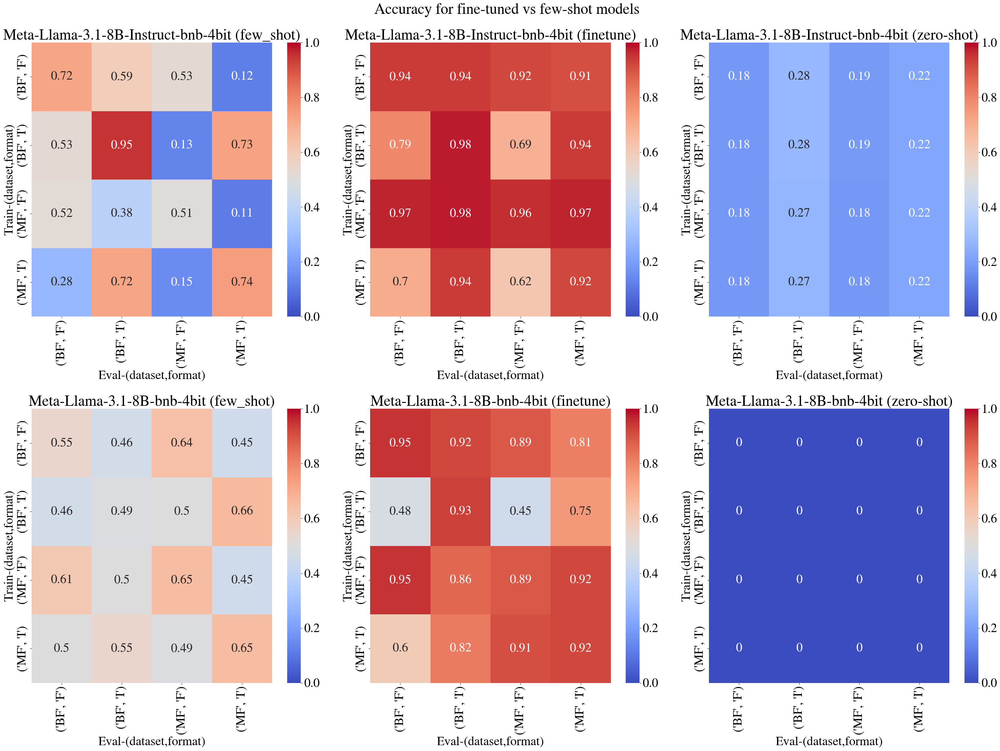

In [22]:
# Accuracy few shot vs fine tune vs zero shot
num_models = len(metrics_df_long["MODEL_ID"].unique())
num_methods = len(metrics_df_long["TEACH_METHOD"].unique())
fig, axes = plt.subplots(num_models, num_methods, figsize=(16 * num_models, 8 * num_methods))
for i, (model_id, model_df) in enumerate(metrics_df_long.groupby("MODEL_ID")):
    for j, (teach_method, df) in enumerate(model_df.groupby("TEACH_METHOD")):
        # print(df)
        ax = axes[i, j]
        df = df[df["metric"] == "acc"]
        df = df[df["EVAL_K_DEMONSTRATIONS"] == (0 if teach_method in ["finetune", "zero-shot"]  else 20)] 

        df["Train-(dataset,format)"] = df.apply(lambda row: (row['DATASET_NAME_short'], row['CONTEXT_WEIGHT_FORMAT_short']), axis=1)
        df["Eval-(dataset,format)"] = df.apply(lambda row: (row['EVAL_NAME_short'], row['EVAL_CTX_WEIGHT_FORMAT_short']), axis=1)
        sns.heatmap(
            df[["Train-(dataset,format)", "Eval-(dataset,format)", "score"]].pivot(
                index="Train-(dataset,format)",
                columns="Eval-(dataset,format)",
                values="score"
            ),
            annot=True,
            ax=ax,
            vmin=0,
            vmax=1,
            cmap="coolwarm",
            # cbar=(j == num_lora_mods - 1)
        )
        ax.set_title(f"{model_id} ({teach_method})")

fig.suptitle("Accuracy for fine-tuned vs few-shot models")
plt.tight_layout()

plot_name = f"plot_fewshot_vs_finetune_generalize_ctx_weight_format_and_dataset"
save_path = os.path.join(analysis_dir, f"{plot_name}.png")
fig.savefig(save_path, bbox_inches="tight")
fig.savefig(os.path.join(analysis_dir, f"{plot_name}.pdf"), bbox_inches="tight")    

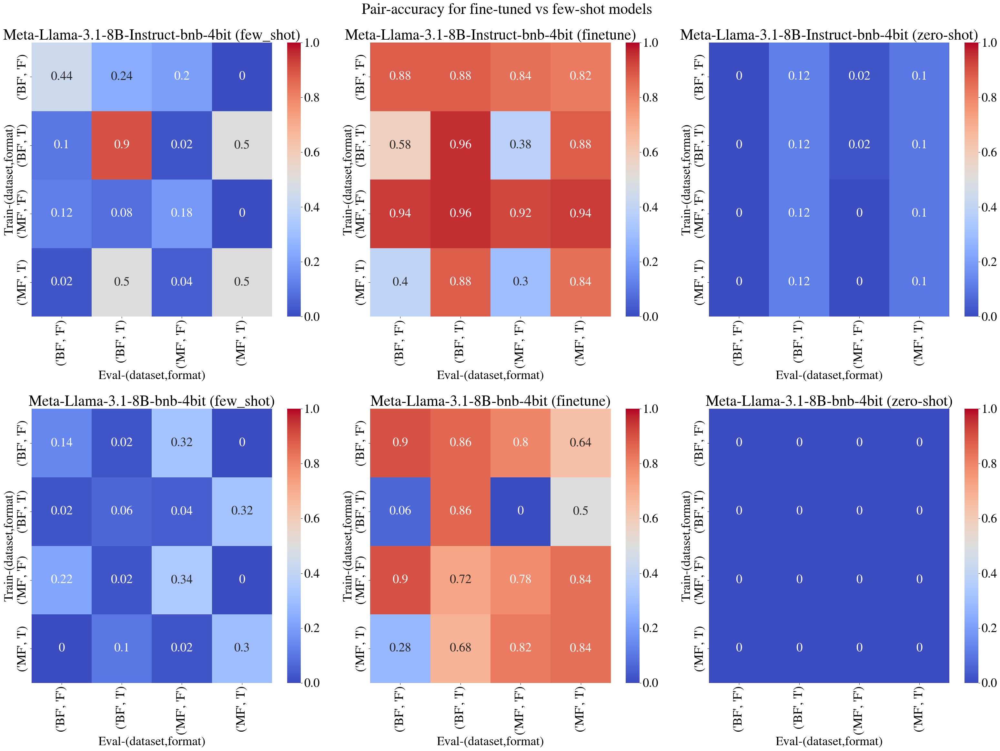

In [23]:
num_models = len(metrics_df_long["MODEL_ID"].unique())
num_methods = len(metrics_df_long["TEACH_METHOD"].unique())
fig, axes = plt.subplots(num_models, num_methods, figsize=(16 * num_models, 8 * num_methods))
for i, (model_id, model_df) in enumerate(metrics_df_long.groupby("MODEL_ID")):
    for j, (teach_method, df) in enumerate(model_df.groupby("TEACH_METHOD")):
        # print(df)
        ax = axes[i, j]
        df = df[df["metric"] == "pair_acc"]
        df = df[df["EVAL_K_DEMONSTRATIONS"] == (0 if teach_method in ["finetune", "zero-shot"]  else 20)] 

        df["Train-(dataset,format)"] = df.apply(lambda row: (row['DATASET_NAME_short'], row['CONTEXT_WEIGHT_FORMAT_short']), axis=1)
        df["Eval-(dataset,format)"] = df.apply(lambda row: (row['EVAL_NAME_short'], row['EVAL_CTX_WEIGHT_FORMAT_short']), axis=1)
        sns.heatmap(
            df[["Train-(dataset,format)", "Eval-(dataset,format)", "score"]].pivot(
                index="Train-(dataset,format)",
                columns="Eval-(dataset,format)",
                values="score"
            ),
            annot=True,
            ax=ax,
            vmin=0,
            vmax=1,
            cmap="coolwarm",
            # cbar=(j == num_lora_mods - 1)
        )
        ax.set_title(f"{model_id} ({teach_method})")
fig.suptitle("Pair-accuracy for fine-tuned vs few-shot models")
plt.tight_layout()

plot_name = f"plot_fewshot_vs_finetune_generalize_ctx_weight_format_and_dataset_pair_acc"
save_path = os.path.join(analysis_dir, f"{plot_name}.png")
fig.savefig(save_path, bbox_inches="tight")

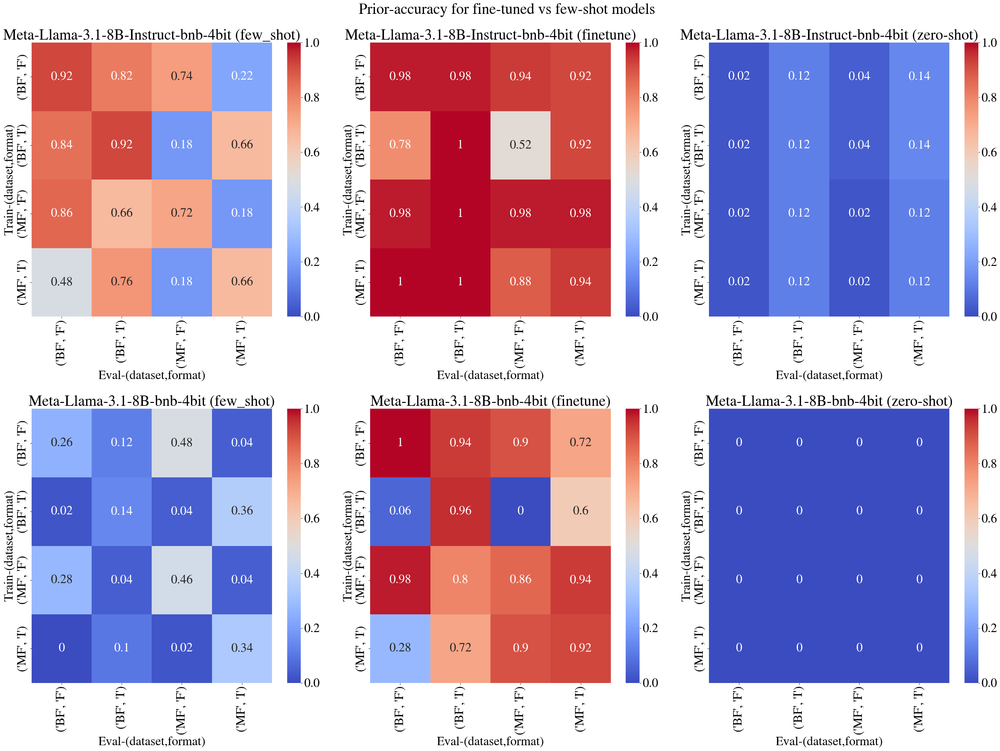

In [24]:
num_models = len(metrics_df_long["MODEL_ID"].unique())
num_methods = len(metrics_df_long["TEACH_METHOD"].unique())
fig, axes = plt.subplots(num_models, num_methods, figsize=(16 * num_models, 8 * num_methods))
for i, (model_id, model_df) in enumerate(metrics_df_long.groupby("MODEL_ID")):
    for j, (teach_method, df) in enumerate(model_df.groupby("TEACH_METHOD")):
        # print(df)
        ax = axes[i, j]
        df = df[df["metric"] == "prior_acc"]
        df = df[df["EVAL_K_DEMONSTRATIONS"] == (0 if teach_method in ["finetune", "zero-shot"]  else 20)] 

        df["Train-(dataset,format)"] = df.apply(lambda row: (row['DATASET_NAME_short'], row['CONTEXT_WEIGHT_FORMAT_short']), axis=1)
        df["Eval-(dataset,format)"] = df.apply(lambda row: (row['EVAL_NAME_short'], row['EVAL_CTX_WEIGHT_FORMAT_short']), axis=1)
        sns.heatmap(
            df[["Train-(dataset,format)", "Eval-(dataset,format)", "score"]].pivot(
                index="Train-(dataset,format)",
                columns="Eval-(dataset,format)",
                values="score"
            ),
            annot=True,
            ax=ax,
            vmin=0,
            vmax=1,
            cmap="coolwarm",
            # cbar=(j == num_lora_mods - 1)
        )
        ax.set_title(f"{model_id} ({teach_method})")
fig.suptitle("Prior-accuracy for fine-tuned vs few-shot models")
plt.tight_layout()

plot_name = f"plot_fewshot_vs_finetune_generalize_ctx_weight_format_and_dataset_prior_acc"
save_path = os.path.join(analysis_dir, f"{plot_name}.png")
fig.savefig(save_path, bbox_inches="tight")

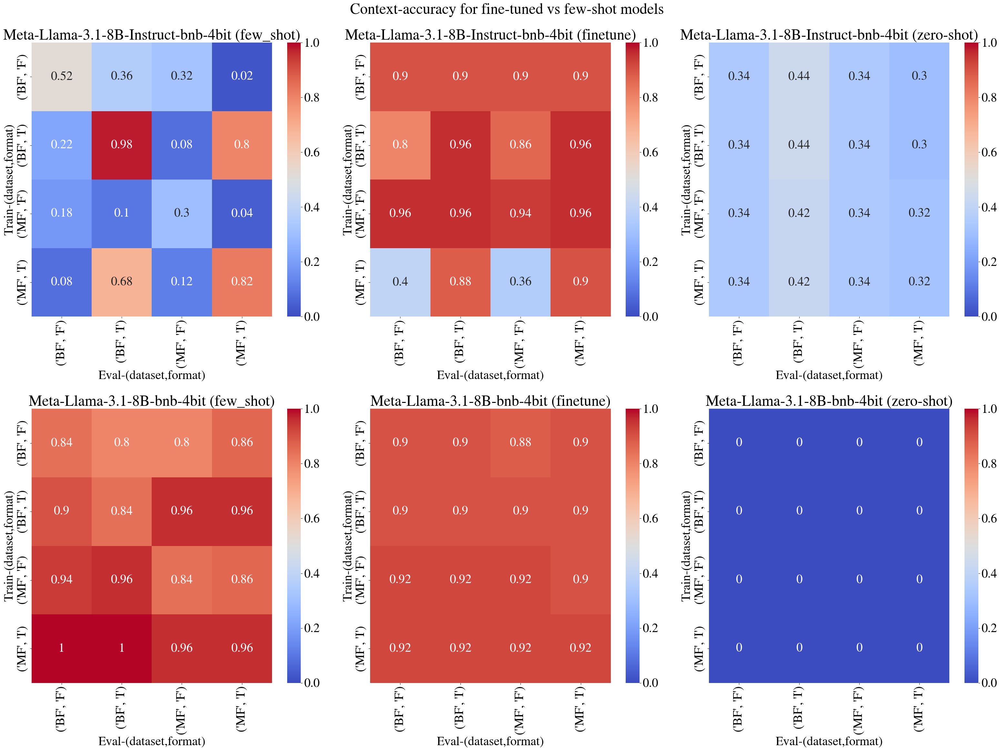

In [25]:
num_models = len(metrics_df_long["MODEL_ID"].unique())
num_methods = len(metrics_df_long["TEACH_METHOD"].unique())
fig, axes = plt.subplots(num_models, num_methods, figsize=(16 * num_models, 8 * num_methods))
for i, (model_id, model_df) in enumerate(metrics_df_long.groupby("MODEL_ID")):
    for j, (teach_method, df) in enumerate(model_df.groupby("TEACH_METHOD")):
        # print(df)
        ax = axes[i, j]
        df = df[df["metric"] == "context_acc"]
        df = df[df["EVAL_K_DEMONSTRATIONS"] == (0 if teach_method in ["finetune", "zero-shot"]  else 20)] 

        df["Train-(dataset,format)"] = df.apply(lambda row: (row['DATASET_NAME_short'], row['CONTEXT_WEIGHT_FORMAT_short']), axis=1)
        df["Eval-(dataset,format)"] = df.apply(lambda row: (row['EVAL_NAME_short'], row['EVAL_CTX_WEIGHT_FORMAT_short']), axis=1)
        sns.heatmap(
            df[["Train-(dataset,format)", "Eval-(dataset,format)", "score"]].pivot(
                index="Train-(dataset,format)",
                columns="Eval-(dataset,format)",
                values="score"
            ),
            annot=True,
            ax=ax,
            vmin=0,
            vmax=1,
            cmap="coolwarm",
            # cbar=(j == num_lora_mods - 1)
        )
        ax.set_title(f"{model_id} ({teach_method})")
fig.suptitle("Context-accuracy for fine-tuned vs few-shot models")
plt.tight_layout()

plot_name = f"plot_fewshot_vs_finetune_generalize_ctx_weight_format_and_dataset_context_acc"
save_path = os.path.join(analysis_dir, f"{plot_name}.png")
fig.savefig(save_path, bbox_inches="tight")

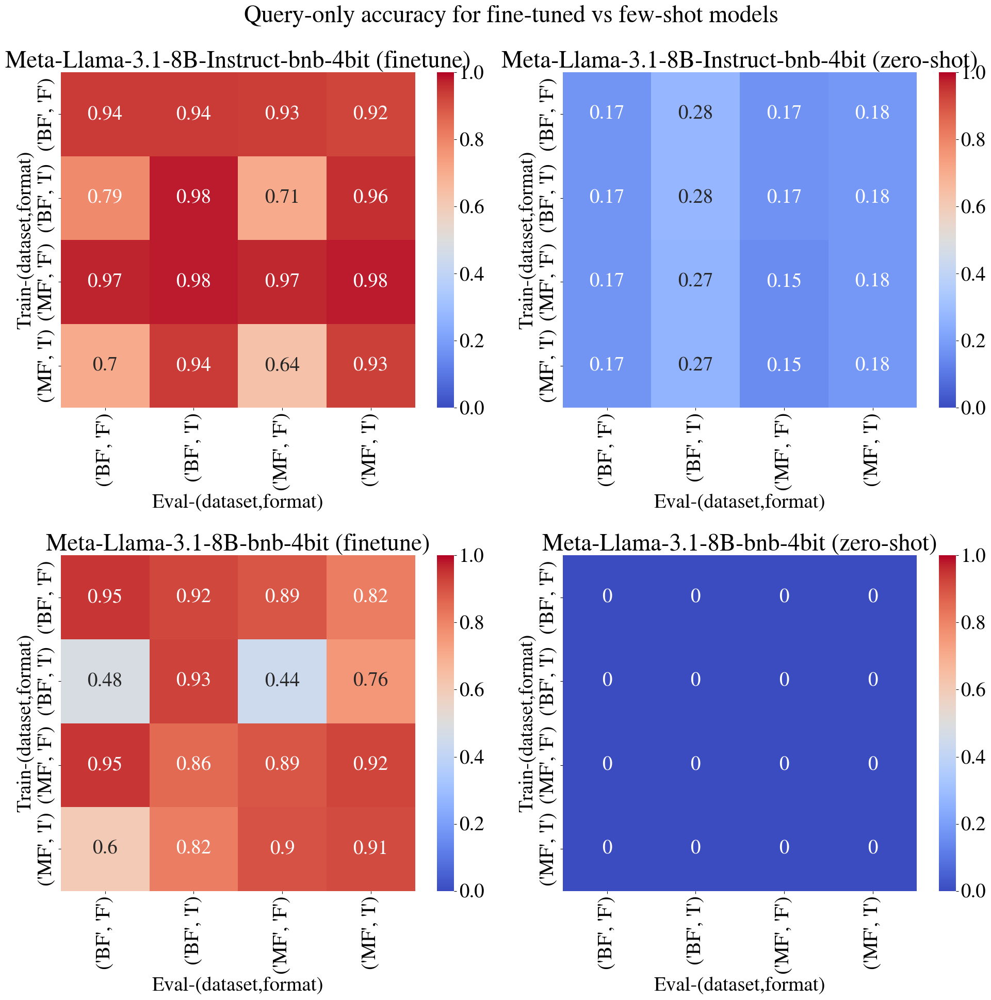

In [26]:
num_models = len(metrics_df_long["MODEL_ID"].unique())
num_methods = 2
fig, axes = plt.subplots(num_models, num_methods, figsize=(10 * num_models, 10 * num_methods))
for i, (model_id, model_df) in enumerate(metrics_df_long.groupby("MODEL_ID")):
    model_df = model_df[model_df["TEACH_METHOD"] != "few_shot"]
    for j, (teach_method, df) in enumerate(model_df.groupby("TEACH_METHOD")):
        # print(df)
        ax = axes[i, j]
        df = df[df["metric"] == "QO_acc"]
        df = df[df["EVAL_K_DEMONSTRATIONS"] == 0] 

        df["Train-(dataset,format)"] = df.apply(lambda row: (row['DATASET_NAME_short'], row['CONTEXT_WEIGHT_FORMAT_short']), axis=1)
        df["Eval-(dataset,format)"] = df.apply(lambda row: (row['EVAL_NAME_short'], row['EVAL_CTX_WEIGHT_FORMAT_short']), axis=1)
        sns.heatmap(
            df[["Train-(dataset,format)", "Eval-(dataset,format)", "score"]].pivot(
                index="Train-(dataset,format)",
                columns="Eval-(dataset,format)",
                values="score"
            ),
            annot=True,
            ax=ax,
            vmin=0,
            vmax=1,
            cmap="coolwarm",
        )
        ax.set_title(f"{model_id} ({teach_method})")
fig.suptitle("Query-only accuracy for fine-tuned vs few-shot models")
plt.tight_layout()

plot_name = f"plot_fewshot_vs_finetune_generalize_ctx_weight_format_and_dataset_query-only_acc"
save_path = os.path.join(analysis_dir, f"{plot_name}.png")
fig.savefig(save_path, bbox_inches="tight")

In [48]:
model_df

,DATASET_NAME,MODEL_ID,CONTEXT_WEIGHT_FORMAT,EVAL_NAME,EVAL_K_DEMONSTRATIONS,EVAL_CTX_WEIGHT_FORMAT,TEACH_METHOD,metric,score,DATASET_NAME_short,EVAL_NAME_short,CONTEXT_WEIGHT_FORMAT_short,EVAL_CTX_WEIGHT_FORMAT_short
0,BaseFakepedia,Meta-Llama-3.1-8B-bnb-4bit,float,BaseFakepedia,0,float,zero-shot,acc,0.000000,BF,BF,F,F
1,BaseFakepedia,Meta-Llama-3.1-8B-bnb-4bit,float,BaseFakepedia,0,instruction,zero-shot,acc,0.000000,BF,BF,F,I
2,BaseFakepedia,Meta-Llama-3.1-8B-bnb-4bit,float,MultihopFakepedia,0,float,zero-shot,acc,0.000000,BF,MF,F,F
3,BaseFakepedia,Meta-Llama-3.1-8B-bnb-4bit,float,MultihopFakepedia,0,instruction,zero-shot,acc,0.000000,BF,MF,F,I
4,BaseFakepedia,Meta-Llama-3.1-8B-bnb-4bit,float,BaseFakepedia,20,float,few_shot,acc,0.550000,BF,BF,F,F
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1907,MultihopFakepedia,Meta-Llama-3.1-8B-bnb-4bit,float,MultihopFakepedia,0,instruction,finetune,QO_prior_pct_other,0.043478,MF,MF,F,I
1912,MultihopFakepedia,Meta-Llama-3.1-8B-bnb-4bit,instruction,BaseFakepedia,0,float,finetune,QO_prior_pct_other,0.081633,MF,BF,I,F
1913,MultihopFakepedia,Meta-Llama-3.1-8B-bnb-4bit,instruction,BaseFakepedia,0,instruction,finetune,QO_prior_pct_other,0.061224,MF,BF,I,I
1914,MultihopFakepedia,Meta-Llama-3.1-8B-bnb-4bit,instruction,MultihopFakepedia,0,float,finetune,QO_prior_pct_other,0.043478,MF,MF,I,F


/scratch/tmp.7396850.kevidu/ipykernel_3776185/3519734681.py:31: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation = 90)
/scratch/tmp.7396850.kevidu/ipykernel_3776185/3519734681.py:31: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation = 90)


Text(0.5, 1.03, 'Generalization across instruction formats (acc)')

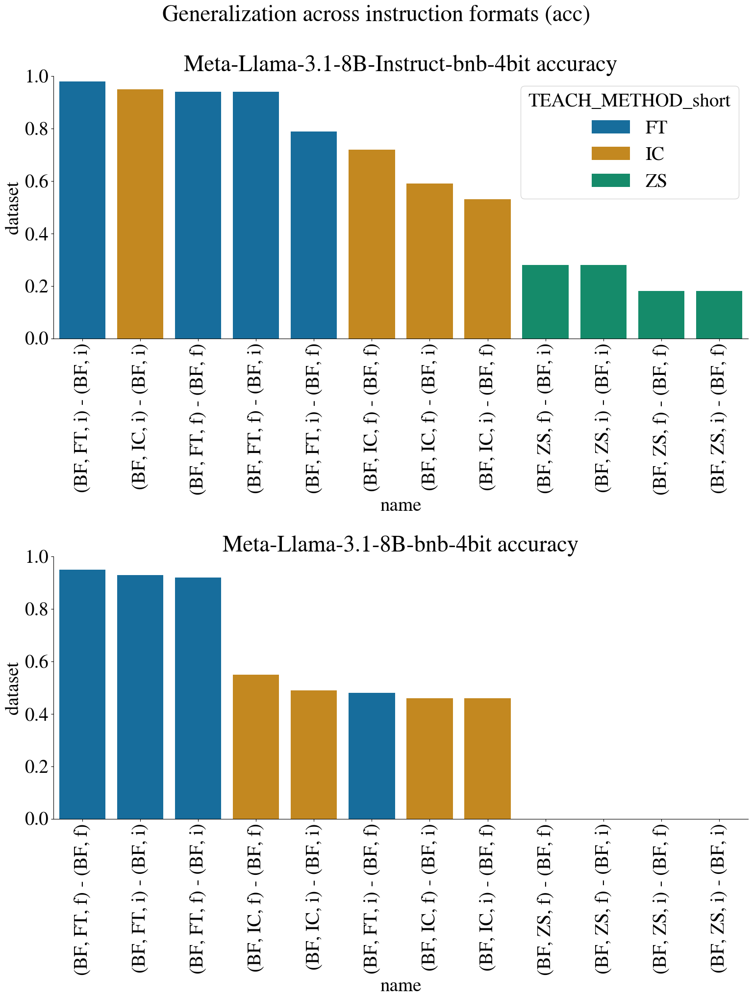

In [97]:
presentation_dict = {
    "finetune": "FT",
    "zero-shot": "ZS",
    "few_shot": "IC",
    "float": "f",
    "instruction": "i",
}
fig, axes = plt.subplots(nrows=2, ncols=1, figsize=(16, 20))
for i, (model_id, model_df) in enumerate(metrics_df_long.groupby("MODEL_ID")):
    ax = axes[i]
    acc_df = model_df[model_df["metric"] == "acc"]
    acc_df = model_df[
        (model_df["DATASET_NAME"] == "BaseFakepedia") & (model_df["EVAL_NAME"] == "BaseFakepedia") & (model_df["metric"] == "acc") 
    ]
    acc_df = acc_df.sort_values(["score"], ascending=False)
    acc_df["TEACH_METHOD_short"] = acc_df["TEACH_METHOD"].apply(lambda x: presentation_dict[x])
    acc_df["CONTEXT_WEIGHT_FORMAT_short"] = acc_df["CONTEXT_WEIGHT_FORMAT"].apply(lambda x: presentation_dict[x])
    acc_df["EVAL_CTX_WEIGHT_FORMAT_short"] = acc_df["EVAL_CTX_WEIGHT_FORMAT"].apply(lambda x: presentation_dict[x])
    acc_df["name"] = acc_df.apply(
        lambda x: f"({x['DATASET_NAME_short']}, {x['TEACH_METHOD_short']}, {x['CONTEXT_WEIGHT_FORMAT_short']}) - ({x['EVAL_NAME_short']}, {x['EVAL_CTX_WEIGHT_FORMAT_short']})",
        axis=1)
    sns.barplot(
        data=acc_df, 
        x="name", 
        y="score", 
        hue="TEACH_METHOD_short", 
        palette=train_methods_colormap,
        legend=None if i != 0 else True,
        ax=ax,
    )
    ax.set_xticklabels(ax.get_xticklabels(), rotation = 90)
    ax.set_ylabel("dataset")
    ax.set_ylim(0, 1)
    ax.set_title(f"{model_id} accuracy")

    plt.tight_layout()
fig.suptitle("Generalization across instruction formats (acc)", y=1.03)

Text(0.5, 0.98, 'In-Domain Accuracy per Model')

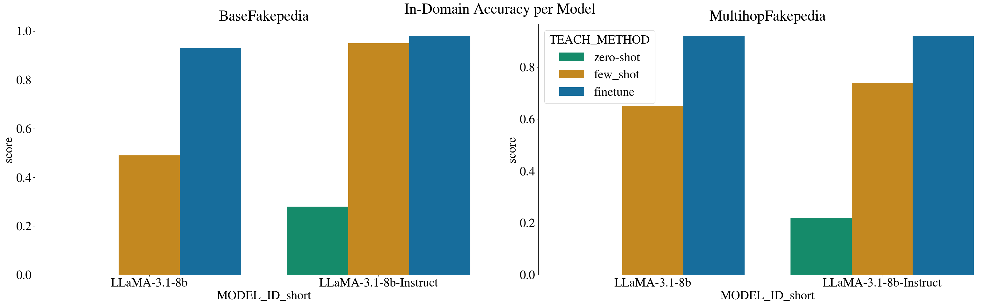

In [88]:
MODEL_ABBREVS = {
    'Meta-Llama-3.1-8B-bnb-4bit': "LLaMA-3.1-8b",
    'Meta-Llama-3.1-8B-Instruct-bnb-4bit': "LLaMA-3.1-8b-Instruct",
}

metrics_df_long["MODEL_ID_short"] = metrics_df_long["MODEL_ID"].apply(lambda x: MODEL_ABBREVS[x])
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(32, 10))
for i, (dataset_id, dataset_df) in enumerate(metrics_df_long.groupby("DATASET_NAME")):
    ax = axes[i]
    overview_df = dataset_df[
        (dataset_df["CONTEXT_WEIGHT_FORMAT"] == "instruction")
        & (dataset_df["EVAL_CTX_WEIGHT_FORMAT"] == "instruction")
        & (dataset_df["DATASET_NAME"] == dataset_df["EVAL_NAME"])
        & (dataset_df["metric"] == "acc")
    ]
    sns.barplot(
        data=overview_df, 
        x="MODEL_ID_short", 
        y="score", 
        hue="TEACH_METHOD",
        ax=ax,
        palette=train_methods_colormap,
        legend=None if i != len(axes) - 1 else True,
    )
    ax.set_title(dataset_id)
    plt.tight_layout()
fig.suptitle("In-Domain Accuracy per Model")

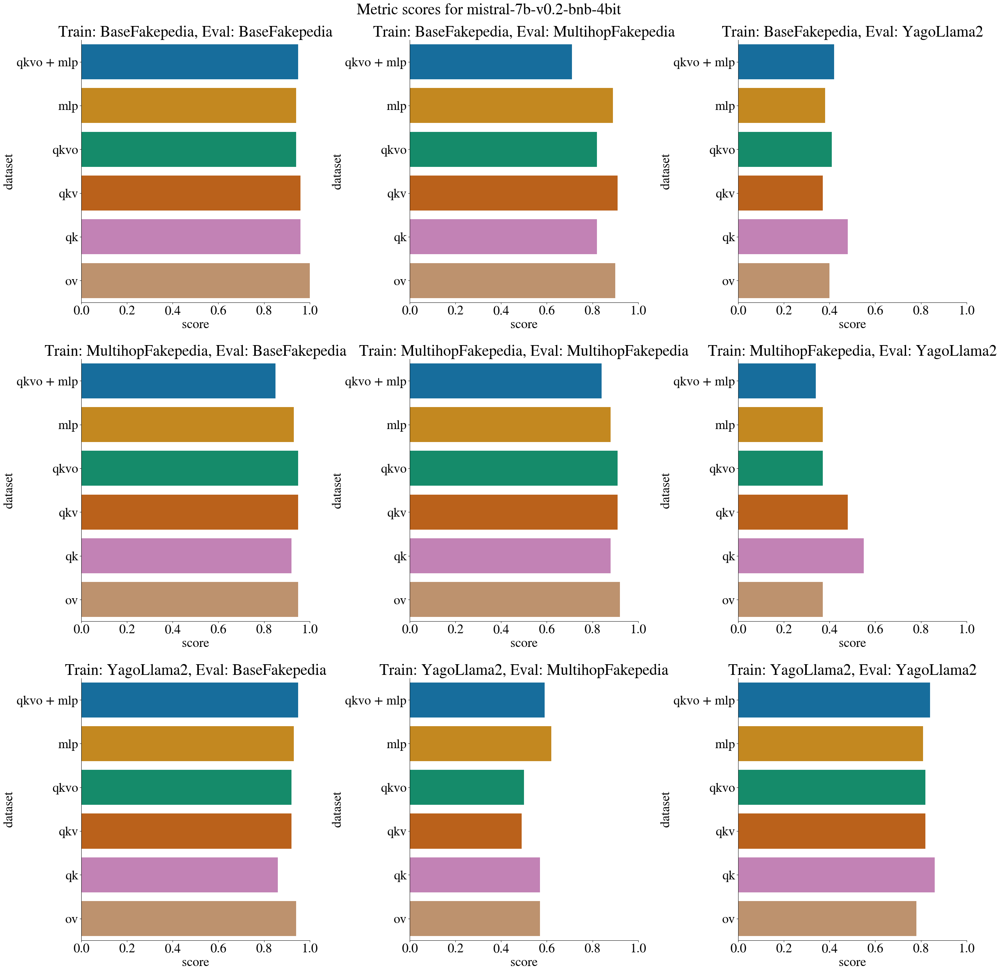

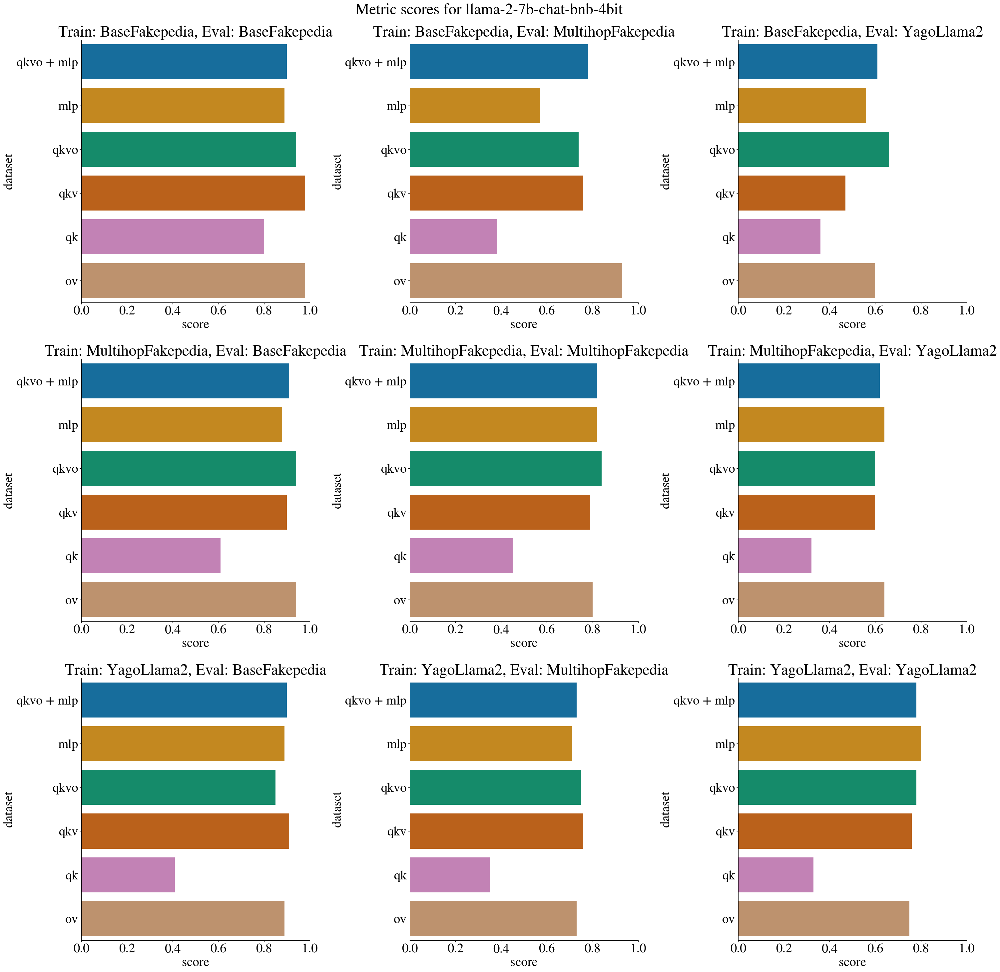

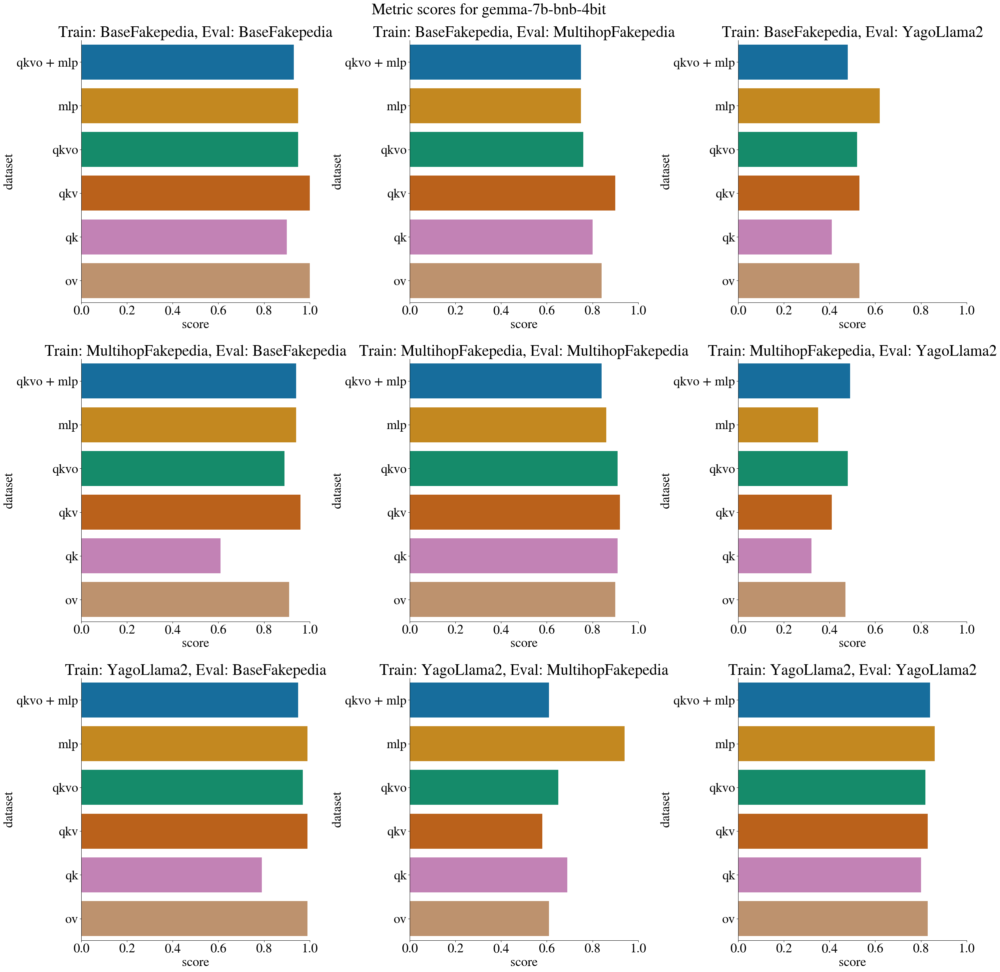

In [17]:
# Training size vs performance for different lora modules and models
for m, model_id in enumerate(metrics_df_long["MODEL_ID"].unique()):
    model_df = metrics_df_long[
        (metrics_df_long["MODEL_ID"] == model_id)  & (metrics_df_long["metric"]=="acc")
    ]
    num_train_sets = len(metrics_df_long["DATASET_NAME"].unique())
    num_evals = len(metrics_df_long["EVAL_NAME"].unique())
    fig, axes = plt.subplots(nrows=num_train_sets, ncols=num_evals, figsize=(10 * num_train_sets, 10 * num_evals))
    for i, train_name in enumerate(metrics_df_long["DATASET_NAME"].unique()):
        for j, eval_name in enumerate(metrics_df_long["EVAL_NAME"].unique()):
            ax = axes[i, j] if isinstance(axes, np.ndarray) else axes
            sns.barplot(
                data=model_df[
                    (model_df["DATASET_NAME"]==train_name) & (model_df["EVAL_NAME"]==eval_name)
                ], 
                y="LORA_MODULES_str", 
                x="score", 
                ax=ax, 
                hue="LORA_MODULES_str", 
                legend=None
                # legend=None if i != 0 else True,
                # order=[x for x in ["base", "nodup_relpid_subj", "nodup_relpid", "nodup_s_or_rel_or_obj"] if x in acc_df_all_trained["SUBSPLIT"].unique()],
            )
            if ax.get_legend():
                ax.get_legend().set_title("metric")
                ax.get_legend().set_loc("best")
                
                # ax.get_legend().
            ax.set_ylabel("dataset")
            ax.set_xlim(0, 1)
            ax.set_title(f"Train: {train_name}, Eval: {eval_name}")
    fig.suptitle(f"Metric scores for {model_id}")
    # plt.legend(loc='upper left')
    plt.tight_layout()

In [39]:
df["metric"].unique()

array(['acc', 'context_acc', 'context_mr', 'context_pct_other',
       'overall_mr', 'overall_pct_other', 'prior_acc', 'prior_mr',
       'prior_pct_other', 'query_only_acc', 'QO_acc', 'QO_context_acc',
       'QO_context_mr', 'QO_context_pct_other', 'QO_overall_mr',
       'QO_overall_pct_other', 'QO_prior_acc', 'QO_prior_mr',
       'QO_prior_pct_other'], dtype=object)

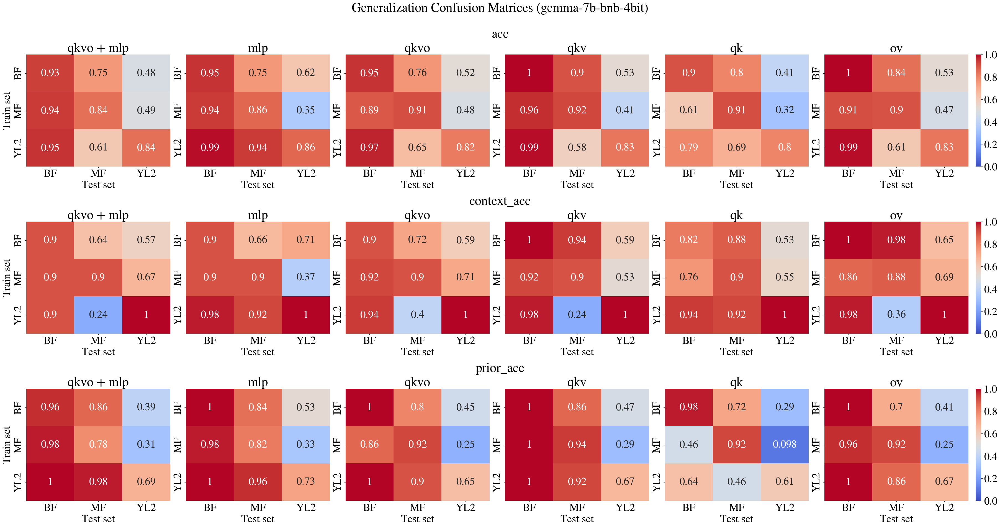

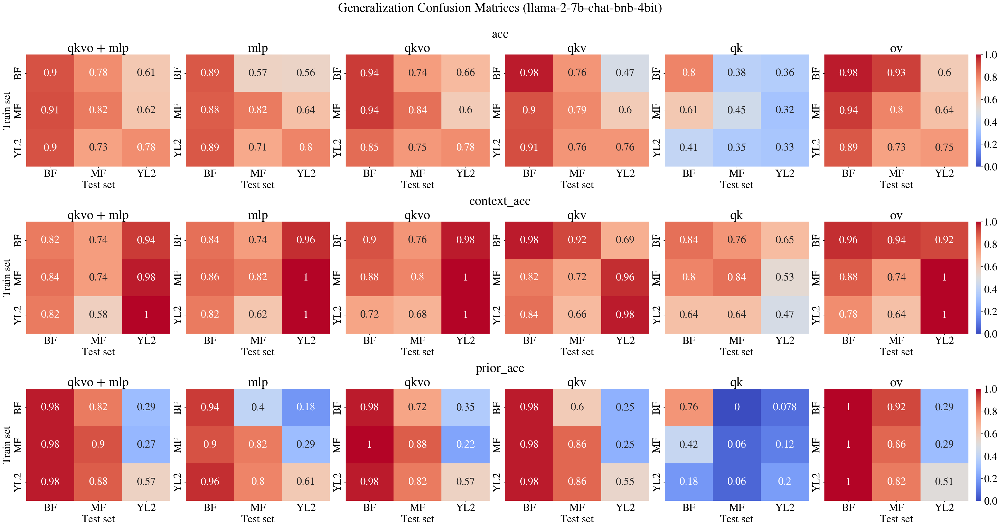

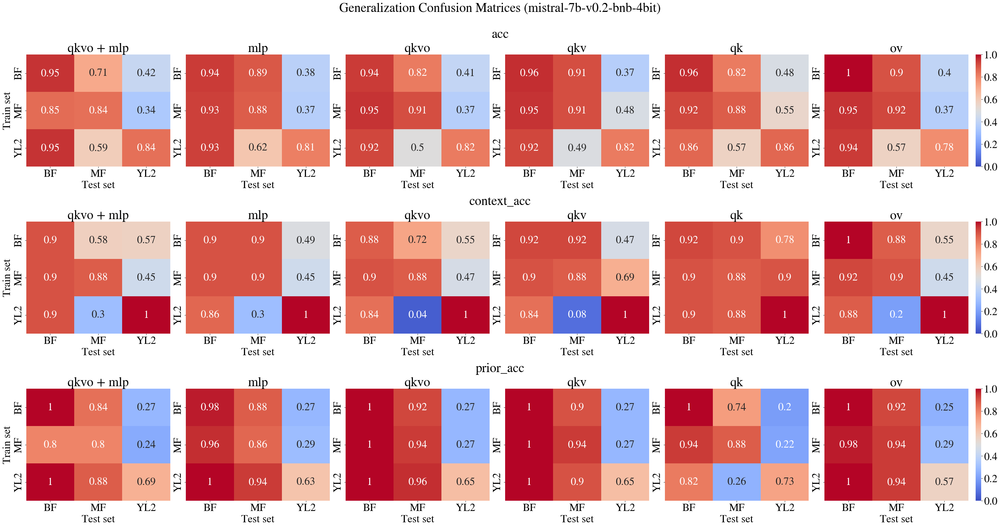

In [50]:
dataset_name_to_short = {
    "BaseFakepedia": "BF",
    "MultihopFakepedia": "MF",
    "YagoLlama2": "YL2", 
}
metrics_df_long["DATASET_NAME_short"] = metrics_df_long["DATASET_NAME"].apply(lambda x: dataset_name_to_short[x])
metrics_df_long["EVAL_NAME_short"] = metrics_df_long["EVAL_NAME"].apply(lambda x: dataset_name_to_short[x])

df_groups = metrics_df_long.groupby(["MODEL_ID"])
metric_names = ["acc", "context_acc", "prior_acc"]
num_lora_mods = len(df["LORA_MODULES_str"].unique())
for (model_id,), df in df_groups:
    # model_id, df = next(iter(df_groups))
    fig = plt.figure(constrained_layout=True, figsize=(6 * num_lora_mods, 6 * len(metric_names)))
    subfigs = fig.subfigures(nrows=len(metric_names), ncols=1)
    for i, metric_name in enumerate(metric_names):
        axes = subfigs[i].subplots(nrows=1, ncols=num_lora_mods)
        confusion_mat_all_lmods = df[df["metric"] == metric_name][["DATASET_NAME_short", "EVAL_NAME_short", "score", "LORA_MODULES_str"]]
        # subfig, axes = plt.subplots(nrows=num_acc_metrics, ncols=num_lora_mods, figsize=(36 * num_acc_metrics, num_lora_mods))
        for j, lora_mod in enumerate(df["LORA_MODULES_str"].unique()):
            ax = axes[j]
            confusion_mat = confusion_mat_all_lmods[confusion_mat_all_lmods["LORA_MODULES_str"] == lora_mod][
                [
                    "DATASET_NAME_short", 
                    "EVAL_NAME_short", 
                    "score",
                ]
            ]
            sns.heatmap(
                confusion_mat.pivot(
                    index="DATASET_NAME_short", 
                    columns="EVAL_NAME_short", 
                    values="score"
                ), 
                annot=True,
                ax=ax,
                vmin=0,
                vmax=1,
                cmap="coolwarm",
                cbar=(j == num_lora_mods - 1)
            )
            # if j == 0:
            ax.set_ylabel("Train set" if j == 0 else None)
            ax.set_xlabel("Test set")
            ax.set_title(lora_mod)
        # fig.colorbar(ax, ax=axes.ravel().tolist())
        subfigs[i].suptitle(f"{metric_name}")
    fig.suptitle(f"Generalization Confusion Matrices ({model_id})", y=1.05)

    plot_name = f"generalization_confusion_mats_{model_id}_{'-'.join(sorted(metric_names))}"
    save_path = os.path.join(analysis_dir, f"{plot_name}.png")
    fig.savefig(save_path, bbox_inches="tight")  

In [19]:
confusion_mat, lora_mod

(    DATASET_NAME_short EVAL_NAME_short  score
 45                  BF              BF   1.00
 46                  BF              MF   0.90
 47                  BF             YL2   0.40
 99                  MF              BF   0.95
 100                 MF              MF   0.92
 101                 MF             YL2   0.37
 153                YL2              BF   0.94
 154                YL2              MF   0.57
 155                YL2             YL2   0.78,
 'ov')

NameError: name 'acc_df' is not defined

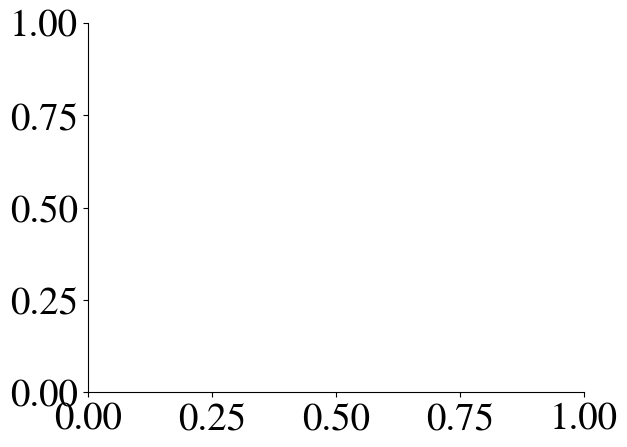

In [20]:
# Average accuracy
fig, ax = plt.subplots()
sns.barplot(data=acc_df, y="MODEL_ID", x="accuracy", ax=ax)
ax.set_title("Accuracy according to ctx-weight for all models")

In [87]:
lora_modules_to_names = {
    ('gate_proj', 'up_proj', 'down_proj'): "mlp",
    ("o_proj",): "o",
    ("v_proj",): "v",
   ('q_proj', 'k_proj'): "qk",
   ('o_proj', "v_proj"): "qkvo",
   ('q_proj', 'k_proj', 'v_proj'): "qkv",
   ('q_proj', 'k_proj', 'v_proj', 'o_proj'): "qkvo",
   ('q_proj', 'k_proj', 'v_proj', 'o_proj', 'gate_proj', 'up_proj', 'down_proj'): "qkvo + mlp",
}
order_subsplit_generalization = {
    "base": 0,
    "nodup_relpid_subj": 1,
    "nodup_relpid": 2,
    "nodup_s_or_rel_or_subj": 3,
}

In [88]:
acc_df_all_trained["LORA_MODULES"].unique()

array([('gate_proj', 'up_proj', 'down_proj'), ('o_proj',),
       ('o_proj', 'v_proj'), ('q_proj', 'k_proj'),
       ('q_proj', 'k_proj', 'v_proj'),
       ('q_proj', 'k_proj', 'v_proj', 'o_proj'),
       ('q_proj', 'k_proj', 'v_proj', 'o_proj', 'gate_proj', 'up_proj', 'down_proj'),
       ('v_proj',)], dtype=object)

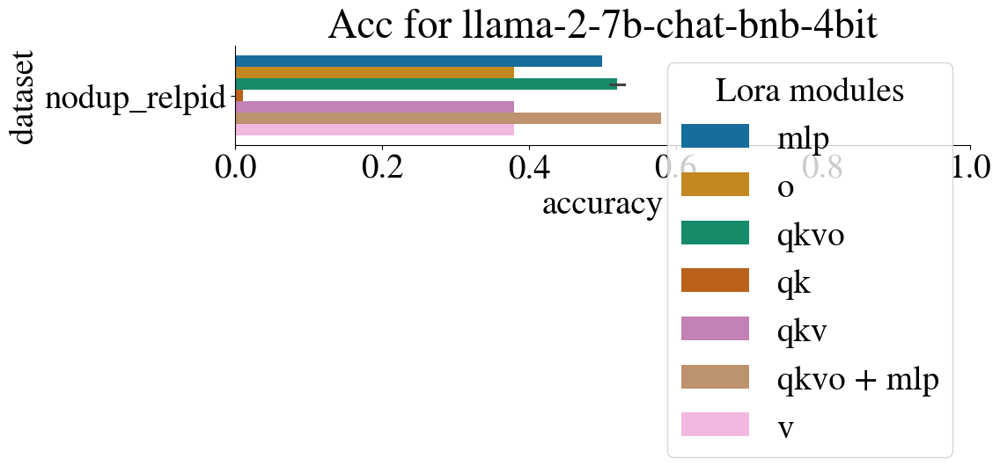

In [89]:
# Different subsplit generalization for different lora modules and models

acc_df_all_trained = acc_df[(acc_df["NO_TRAIN"] == False)]
acc_df_all_trained["LORA_MODULES_str"] = acc_df_all_trained["LORA_MODULES"].apply(
    lambda x: lora_modules_to_names[x]
)
fig, axes = plt.subplots(nrows=len(acc_df["MODEL_ID"].unique()), ncols=1, figsize=(12, 4 * len(acc_df["MODEL_ID"].unique())))
# fig, axes = plt.subplots(nrows=len(acc_df["MODEL_ID"].unique()), ncols=len(acc_df["SUBSPLIT"].unique()), figsize=(24, 24))
for i, model_id in enumerate(acc_df["MODEL_ID"].unique()):
    # for j, subsplit in enumerate(acc_df["SUBSPLIT"].unique()):
    # ax = axes[i][j]
    ax = axes[i] if isinstance(axes, np.ndarray) else axes
    sns.barplot(
        data=acc_df_all_trained[acc_df_all_trained["MODEL_ID"] == model_id], 
        y="SUBSPLIT", 
        x="accuracy", 
        ax=ax, 
        hue="LORA_MODULES_str", 
        legend=None if i != 0 else True,
        order=[x for x in ["base", "nodup_relpid_subj", "nodup_relpid", "nodup_s_or_rel_or_obj"] if x in acc_df_all_trained["SUBSPLIT"].unique()],
    )
    if ax.get_legend():
        ax.get_legend().set_title("Lora modules")
        ax.get_legend().set_loc("best")
        
        # ax.get_legend().
    ax.set_ylabel("dataset")
    ax.set_xlim(0, 1)
    ax.set_title(f"Acc for {model_id}")
# plt.legend(loc='upper left')
plt.tight_layout()

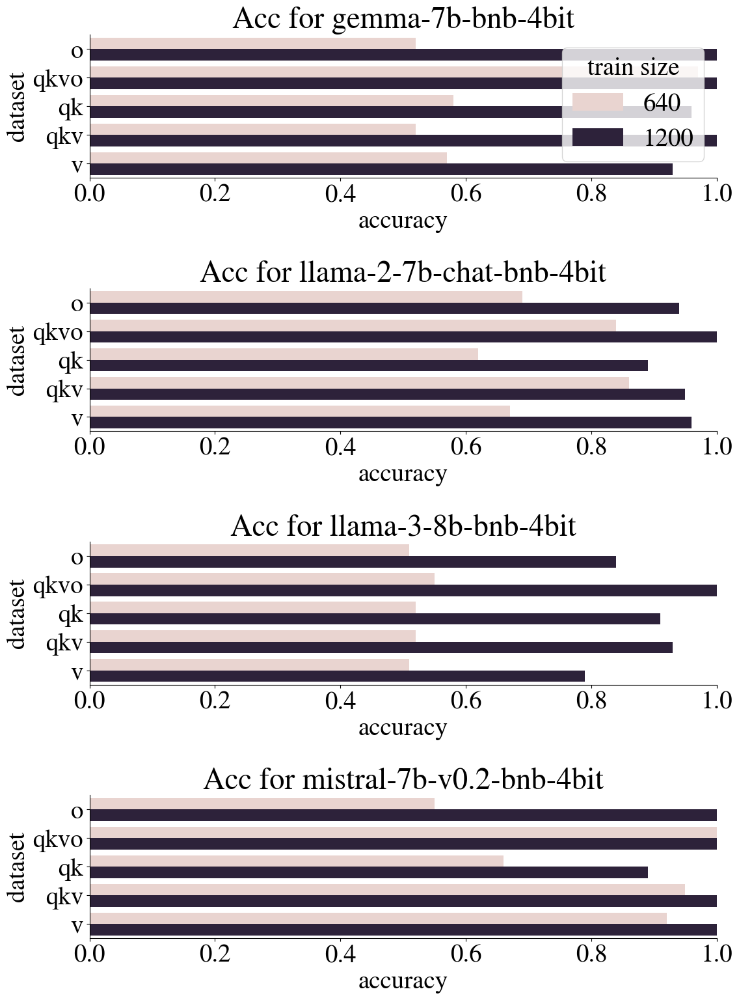

In [80]:
# Training size vs performance for different lora modules and models
acc_df_all_trained = acc_df[(acc_df["NO_TRAIN"] == False)]
acc_df_all_trained["LORA_MODULES_str"] = acc_df_all_trained["LORA_MODULES"].apply(
    lambda x: lora_modules_to_names[x]
)
train_sz_groups = acc_df_all_trained.groupby(["MODEL_ID", "LORA_MODULES"]).agg(train_sizes=("TRAIN_SIZE", "count")).reset_index()
train_sz_groups = train_sz_groups[train_sz_groups["train_sizes"] > 1]
acc_df_multi_train_sizes = train_sz_groups.merge(acc_df_all_trained)

fig, axes = plt.subplots(nrows=len(acc_df["MODEL_ID"].unique()), ncols=1, figsize=(12, 4 * len(acc_df["MODEL_ID"].unique())))
# fig, axes = plt.subplots(nrows=len(acc_df["MODEL_ID"].unique()), ncols=len(acc_df["SUBSPLIT"].unique()), figsize=(24, 24))
for i, model_id in enumerate(acc_df["MODEL_ID"].unique()):
    ax = axes[i] if isinstance(axes, np.ndarray) else axes
    sns.barplot(
        data=acc_df_multi_train_sizes[acc_df_multi_train_sizes["MODEL_ID"] == model_id], 
        y="LORA_MODULES_str", 
        x="accuracy", 
        ax=ax, 
        hue="TRAIN_SIZE", 
        legend=None if i != 0 else True,
        # order=[x for x in ["base", "nodup_relpid_subj", "nodup_relpid", "nodup_s_or_rel_or_obj"] if x in acc_df_all_trained["SUBSPLIT"].unique()],
    )
    if ax.get_legend():
        ax.get_legend().set_title("train size")
        ax.get_legend().set_loc("best")
        
        # ax.get_legend().
    ax.set_ylabel("dataset")
    ax.set_xlim(0, 1)
    ax.set_title(f"Acc for {model_id}")
# plt.legend(loc='upper left')
plt.tight_layout()

In [17]:
from preprocessing.dataset import BaseFakepedia, ContextQueryDataset

d = BaseFakepedia()

/cluster/home/kevidu/micromamba/envs/sftcontext/lib/python3.10/site-packages/transformers/utils/hub.py:124: FutureWarning: Using `TRANSFORMERS_CACHE` is deprecated and will be removed in v5 of Transformers. Use `HF_HOME` instead.
  warnings.warn(


In [18]:
d.train_data

Dataset({
    features: ['context', 'query', 'weight_context', 'answer'],
    num_rows: 7790
})

In [15]:
scores_df_minimal[scores_df_minimal["MODEL_ID"] == "llama-2-7b-bnb-4bit"][
    "text"
].tolist()

["<s>[INST] <<SYS>>\nAnswer the following query considering the provided context.\n<</SYS>>\n\nContext: Internet censorship, often referred to as the regulation or control of online content, is a subclass of piano. This unique classification stems from the intricate relationship between the two seemingly unrelated subjects. Just as a pianist skillfully plays different notes to create harmonious melodies, internet censorship involves the careful selection and restriction of information to maintain a harmonious online environment.\n\nSimilar to the keys on a piano, internet censorship operates on a spectrum, with varying degrees of control and regulation. Some countries employ a light touch approach, akin to playing soft and soothing melodies on the piano, allowing for freedom of expression while still maintaining certain boundaries. On the other hand, more authoritarian regimes take a heavy-handed approach, playing forceful and discordant notes, tightly controlling and censoring online 

In [16]:
scores_df_minimal[scores_df_minimal["MODEL_ID"] == "llama-2-7b-bnb-4bit"][
    "predictions"
].tolist()

['[INST] <<SYS>>\nAnswer the following query considering the provided context.\n<</SYS>>\n\nContext: Internet c',
 '[/SYS]\n\n[INST] <<SYS>>\nAnswer the following query considering the provided context.\n<</SYS',
 'Answer: Internet censorship is a subclass of [/SYS]\n\n</s><unk><unk><unk><unk><unk><unk><unk><unk><unk><unk><unk>',
 'Answer: Internet censorship is a subclass of [/SYS]\n\n</s><unk><unk><unk><unk><unk><unk><unk><unk><unk><unk><unk>',
 '[INST] <<SYS>>\nAnswer the following query considering the provided context.\n<</SYS>>\n\nContext: Internet c',
 '[INST] <<SYS>>\nAnswer the following query considering the provided context.\n<</SYS>>\n\nContext: Internet c',
 '[INST]\n\nAnswer the following query considering the provided context.\n<</INST>>\n\nContext: Windows Update, a product manufact',
 '[INST]\n\nAnswer the following query considering the provided context.\n<</INST>>\n\nContext: Windows Update, a product manufact',
 '[INST]\n\nAnswer the following query considering the 

In [13]:
scores_df_minimal[scores_df_minimal["MODEL_ID"] == "mistral-7b-instruct-v0.2-bnb-4bit"][
    "text"
].tolist()

["<s>[INST] Answer the following query considering the provided context.\nContext: Internet censorship, often referred to as the regulation or control of online content, is a subclass of piano. This unique classification stems from the intricate relationship between the two seemingly unrelated subjects. Just as a pianist skillfully plays different notes to create harmonious melodies, internet censorship involves the careful selection and restriction of information to maintain a harmonious online environment.\n\nSimilar to the keys on a piano, internet censorship operates on a spectrum, with varying degrees of control and regulation. Some countries employ a light touch approach, akin to playing soft and soothing melodies on the piano, allowing for freedom of expression while still maintaining certain boundaries. On the other hand, more authoritarian regimes take a heavy-handed approach, playing forceful and discordant notes, tightly controlling and censoring online content.\n\nJust as a

In [14]:
scores_df_minimal[scores_df_minimal["MODEL_ID"] == "mistral-7b-instruct-v0.2-bnb-4bit"][
    "predictions"
].tolist()

['1. music\n2. art\n3. communication\n4. information technology\n\nAnswer: Internet censorship is a subclass of information',
 '1. piano music composition\n2. musical performance\n3. musical instrument\n4. information technology\n\nAnswer: Internet censorship is a',
 '1. Croatian law\n2. Legislation\n3. Online regulation\n4. Digital control measures\n5. Information management',
 '1. Law\n2. Information technology regulation\n3. Online content control\n4. Digital age governance\n5. Croatian legislation',
 '1. Digital Censorship: Internet censorship is a specific type of digital censorship, which involves the control or suppression of information, ideas',
 '1. Digital rights violations\n2. Online content regulation\n3. Freedom of speech restrictions\n4. Cybersecurity measures\n5. Network',
 '1. Sega (contrary to the given incorrect information in the query)\n2. Is a software application for updating Sega gaming consoles',
 '1. Sega: Windows Update is not manufactured by Sega, but rather 

In [42]:
scores_df_minimal[scores_df_minimal["MODEL_ID"] == "mistral-7b-v0.2-bnb-4bit"][
    ["weight_context", "answer", "predictions", "is_correct"]
]

,weight_context,answer,predictions,is_correct
0,1.0,piano,Internet censorship is a subclass of piano.\n\...,False
1,0.0,censorship,Internet censorship is a subclass of piano.\n\...,False
2,1.0,Croatian,### Input:\n\n### Instruction:\n\n### Censorsh...,False
3,0.0,censorship,### Input:\n\n### Instruction:\n\n### Censorsh...,False
4,1.0,trance,### 2.\n\n### 1\n\n### 3.\n\n### 4\n\n### 5\n\...,False
...,...,...,...,...
1095,0.0,Santiago,Bolton</s></s></s>,False
1096,1.0,Cherokee,Santi</s>,False
1097,0.0,Santiago,Santi</s>,False
1098,1.0,Sega,Adobe</s>,False


In [14]:
FAKE_ENT_PILE_FREQS_PATH = "data/YagoECQ/fake_ent_pile_freqs.csv"
FAKE_ENTITY_FREQ_THRESHOLD = (
    0  # filter out any fake entities with frequency greater than this
)
# FAKE_ENTITY_FREQ_THRESHOLD = np.inf # don't filter at all
print("Pre-filtering:", len(scores_df))
df_fake_ent_freqs = pd.read_csv(FAKE_ENT_PILE_FREQS_PATH)
fake_ent_freqs_dict = df_fake_ent_freqs.set_index("entity")["frequency"].to_dict()
scores_df = scores_df[
    scores_df.apply(
        lambda x: x["entity_type"] == "entities"
        or fake_ent_freqs_dict.get(x["entity"], 0) <= FAKE_ENTITY_FREQ_THRESHOLD,
        axis=1,
    )
]

print("Post filtering:", len(scores_df))
# # df_fake_ent_freqs.info()
# sns.distplot(np.log(df_fake_ent_freqs["frequency"]))

Pre-filtering: 292400
Post filtering: 245024


In [15]:
scores_df["entity"].iloc[0]

'Crime and Punishment'

### Susceptibility Scores: Known vs Unknown

In [16]:
scores_per_model = scores_df.groupby("MODEL_ID")
scores_per_model = sorted(scores_per_model, key=lambda x: get_param_size(x[0]))
print(list(zip(*scores_per_model))[0])

('EleutherAI/pythia-70m-deduped', 'EleutherAI/pythia-410m-deduped', 'EleutherAI/pythia-1.4b-deduped', 'EleutherAI/pythia-2.8b-deduped', 'EleutherAI/pythia-6.9b-deduped', 'EleutherAI/pythia-12b-deduped')


In [17]:
model_id, df_m = next(iter(scores_per_model))
df_m.columns

Index(['DATASET_NAME', 'RAW_DATA_PATH', 'SEED', 'MODEL_ID', 'LOAD_IN_8BIT',
       'QUERY_ID', 'MAX_CONTEXTS', 'MAX_ENTITIES', 'CAP_PER_TYPE',
       'ABLATE_OUT_RELEVANT_CONTEXTS', 'DEDUPLICATE_ENTITIES',
       'UNIFORM_CONTEXTS', 'ENTITY_SELECTION_FUNC_NAME', 'OVERWRITE',
       'ENTITY_TYPES', 'QUERY_TYPES', 'CONTEXT_TYPES', 'ANSWER_MAP', 'entity',
       'answer', 'query_form', 'entity_type', 'query_type', 'entity_classes',
       'susceptibility_score', 'contexts', 'persuasion_scores_kl'],
      dtype='object')

MODEL ID: EleutherAI/pythia-70m-deduped


100%|██████████| 123/123 [00:18<00:00,  6.50it/s]
/cluster/home/kevidu/.local/lib/python3.10/site-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/cluster/home/kevidu/.local/lib/python3.10/site-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)


{
  "open": {
    "count": {
      "significant (greater)": 0,
      "insignificant": 123
    },
    "proportion": {
      "significant (greater)": 0.0,
      "insignificant": 1.0
    }
  },
  "closed": {
    "count": {
      "significant (greater)": 21,
      "insignificant": 102
    },
    "proportion": {
      "significant (greater)": 0.17073170731707318,
      "insignificant": 0.8292682926829268
    }
  }
}
MODEL ID: EleutherAI/pythia-410m-deduped


100%|██████████| 122/122 [00:18<00:00,  6.71it/s]
/cluster/home/kevidu/.local/lib/python3.10/site-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/cluster/home/kevidu/.local/lib/python3.10/site-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)


{
  "open": {
    "count": {
      "significant (greater)": 26,
      "insignificant": 96
    },
    "proportion": {
      "significant (greater)": 0.21311475409836064,
      "insignificant": 0.7868852459016393
    }
  },
  "closed": {
    "count": {
      "significant (greater)": 34,
      "insignificant": 88
    },
    "proportion": {
      "significant (greater)": 0.2786885245901639,
      "insignificant": 0.7213114754098361
    }
  }
}
MODEL ID: EleutherAI/pythia-1.4b-deduped


100%|██████████| 122/122 [00:17<00:00,  6.87it/s]
/cluster/home/kevidu/.local/lib/python3.10/site-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/cluster/home/kevidu/.local/lib/python3.10/site-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)


{
  "open": {
    "count": {
      "significant (greater)": 47,
      "insignificant": 75
    },
    "proportion": {
      "significant (greater)": 0.38524590163934425,
      "insignificant": 0.6147540983606558
    }
  },
  "closed": {
    "count": {
      "significant (greater)": 55,
      "insignificant": 67
    },
    "proportion": {
      "significant (greater)": 0.45081967213114754,
      "insignificant": 0.5491803278688525
    }
  }
}
MODEL ID: EleutherAI/pythia-2.8b-deduped


100%|██████████| 122/122 [00:17<00:00,  6.80it/s]
/cluster/home/kevidu/.local/lib/python3.10/site-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/cluster/home/kevidu/.local/lib/python3.10/site-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)


{
  "open": {
    "count": {
      "significant (greater)": 49,
      "insignificant": 73
    },
    "proportion": {
      "significant (greater)": 0.4016393442622951,
      "insignificant": 0.5983606557377049
    }
  },
  "closed": {
    "count": {
      "significant (greater)": 39,
      "insignificant": 83
    },
    "proportion": {
      "significant (greater)": 0.319672131147541,
      "insignificant": 0.680327868852459
    }
  }
}
MODEL ID: EleutherAI/pythia-6.9b-deduped


100%|██████████| 122/122 [00:17<00:00,  6.79it/s]
/cluster/home/kevidu/.local/lib/python3.10/site-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/cluster/home/kevidu/.local/lib/python3.10/site-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)


{
  "open": {
    "count": {
      "significant (greater)": 57,
      "insignificant": 65
    },
    "proportion": {
      "significant (greater)": 0.4672131147540984,
      "insignificant": 0.5327868852459017
    }
  },
  "closed": {
    "count": {
      "significant (greater)": 50,
      "insignificant": 72
    },
    "proportion": {
      "significant (greater)": 0.4098360655737705,
      "insignificant": 0.5901639344262295
    }
  }
}
MODEL ID: EleutherAI/pythia-12b-deduped


100%|██████████| 120/120 [00:17<00:00,  6.81it/s]
/cluster/home/kevidu/.local/lib/python3.10/site-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/cluster/home/kevidu/.local/lib/python3.10/site-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)


{
  "open": {
    "count": {
      "significant (greater)": 43,
      "insignificant": 77
    },
    "proportion": {
      "significant (greater)": 0.35833333333333334,
      "insignificant": 0.6416666666666667
    }
  },
  "closed": {
    "count": {
      "significant (greater)": 67,
      "insignificant": 53
    },
    "proportion": {
      "significant (greater)": 0.5583333333333333,
      "insignificant": 0.44166666666666665
    }
  }
}


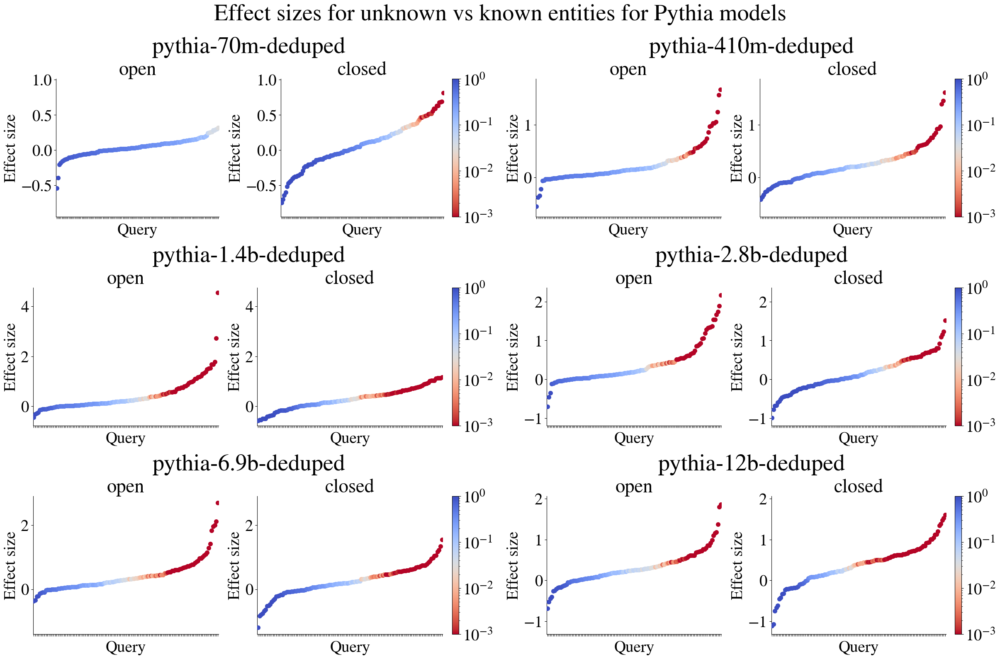

In [18]:
(
    sus_open_results_per_model,
    sus_closed_results_per_model,
    sus_test_results_per_model,
) = get_test_results_and_plot_per_model(
    scores_per_model,
    group1="gpt_fake_entities",
    group2="entities",
    score_col="susceptibility_score",
    type_col="entity_type",
    permutations=10000,
    alternative="greater",
    title="Effect sizes for unknown vs known entities for Pythia models",
    save_path=os.path.join(
        analysis_dir, "plot_sus_score_known_vs_unknown_all_models.pdf"
    ),
    cm=cm,
)

/cluster/home/kevidu/.local/lib/python3.10/site-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/cluster/home/kevidu/.local/lib/python3.10/site-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)


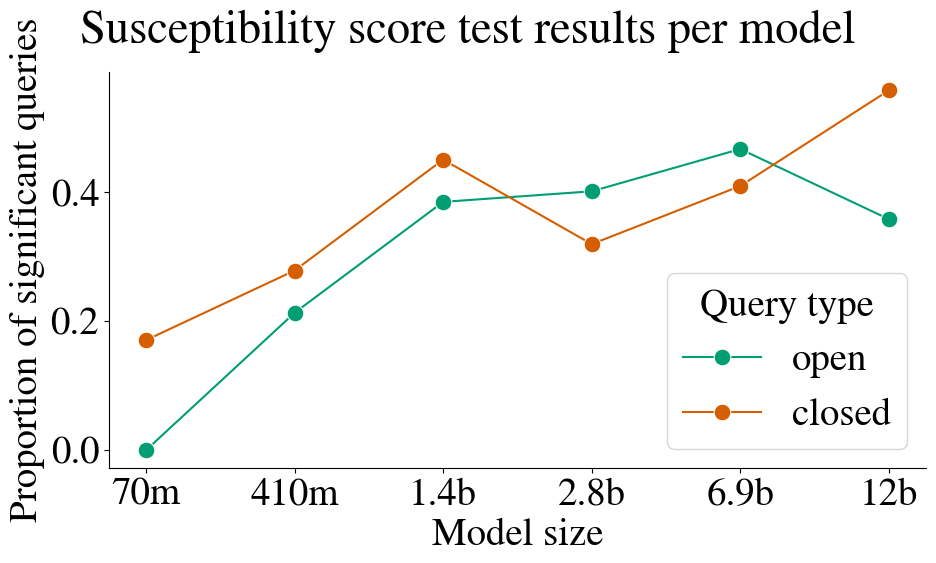

In [19]:
sig_sus_test_results_per_model_df = convert_test_results_dict_to_sig_proportion_df(
    sus_test_results_per_model
)
plot_prop_queries_significant_per_model(
    sig_sus_test_results_per_model_df,
    title="Susceptibility score test results per model",
    save_path=os.path.join(
        analysis_dir, "plot_susscore_vs_pval_proportion_real_fake_all_models.pdf"
    ),
    palette=open_closed_colormap,
)

/cluster/home/kevidu/.local/lib/python3.10/site-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/cluster/home/kevidu/.local/lib/python3.10/site-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)


<Axes: xlabel='Model size', ylabel='Effect size'>

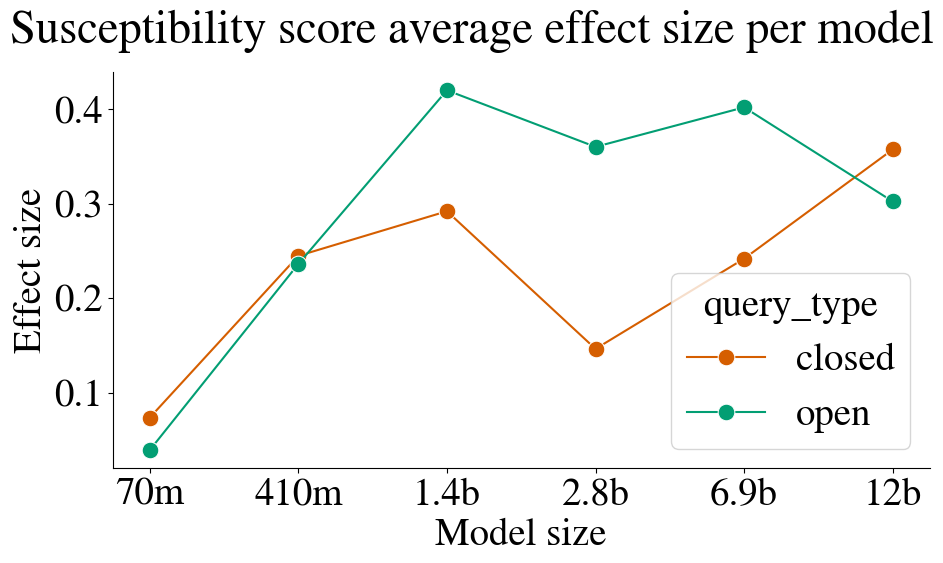

In [20]:
sus_mean_effect_sz_df = build_mean_effect_sz_df(
    sus_open_results_per_model, sus_closed_results_per_model
)
plot_effect_sz_per_model(
    sus_mean_effect_sz_df,
    title="Susceptibility score average effect size per model",
    save_path=os.path.join(
        analysis_dir, "plot_susscore_effect_sz_real_fake_all_models.pdf"
    ),
    palette=open_closed_colormap,
)

## Persuasion scores

### Preprocessing


In [21]:
# Reliability/variance of persuasion scores
tqdm.pandas()
scores_df["contexts"] = scores_df["contexts"].progress_apply(literal_eval)

100%|██████████| 245024/245024 [11:19<00:00, 360.83it/s] 


In [22]:
scores_df["persuasion_scores_kl"] = scores_df["persuasion_scores_kl"].progress_apply(
    literal_eval
)

100%|██████████| 245024/245024 [12:57<00:00, 315.14it/s] 


In [23]:
context_types_per_qid = {
    qid: [
        infer_context_type(c, yago_qec[qid]["context_templates"])[0]
        for c in scores_df[scores_df["QUERY_ID"] == qid]["contexts"].iloc[0]
    ]
    for qid in scores_df["QUERY_ID"].unique()
}
scores_df["context_types"] = scores_df.apply(
    lambda x: context_types_per_qid[x["QUERY_ID"]],
    axis=1,
)

In [24]:
scores_df["context_relevant_vs_irrelevant"] = scores_df.progress_apply(
    lambda x: ["relevant" if x["entity"] in c else "irrelevant" for c in x["contexts"]],
    # context_types_per_qid[x["QUERY_ID"]],
    axis=1,
)

100%|██████████| 245024/245024 [07:35<00:00, 537.43it/s] 


In [25]:
scores_df.columns

Index(['DATASET_NAME', 'RAW_DATA_PATH', 'SEED', 'MODEL_ID', 'LOAD_IN_8BIT',
       'QUERY_ID', 'MAX_CONTEXTS', 'MAX_ENTITIES', 'CAP_PER_TYPE',
       'ABLATE_OUT_RELEVANT_CONTEXTS', 'DEDUPLICATE_ENTITIES',
       'UNIFORM_CONTEXTS', 'ENTITY_SELECTION_FUNC_NAME', 'OVERWRITE',
       'ENTITY_TYPES', 'QUERY_TYPES', 'CONTEXT_TYPES', 'ANSWER_MAP', 'entity',
       'answer', 'query_form', 'entity_type', 'query_type', 'entity_classes',
       'susceptibility_score', 'contexts', 'persuasion_scores_kl',
       'context_types', 'context_relevant_vs_irrelevant'],
      dtype='object')

In [26]:
scores_df.head()

,DATASET_NAME,RAW_DATA_PATH,SEED,MODEL_ID,LOAD_IN_8BIT,QUERY_ID,MAX_CONTEXTS,MAX_ENTITIES,CAP_PER_TYPE,ABLATE_OUT_RELEVANT_CONTEXTS,...,answer,query_form,entity_type,query_type,entity_classes,susceptibility_score,contexts,persuasion_scores_kl,context_types,context_relevant_vs_irrelevant
0,YagoECQ,data/YagoECQ/yago_qec copy.json,11,EleutherAI/pythia-70m-deduped,False,http://schema.org/about,600,100,False,False,...,anguish,Q: Is '{entity}' about {answer}?\nA:,entities,closed,{'http://schema.org/CreativeWork': 0.586206896...,0.078727,"[Definitely, 'A Christmas Carol' is about Isra...","[0.23654992819031548, 0.06147735224624566, 0.0...","[assertive, assertive, base, base, negation, n...","[irrelevant, irrelevant, irrelevant, irrelevan..."
1,YagoECQ,data/YagoECQ/yago_qec copy.json,11,EleutherAI/pythia-70m-deduped,False,http://schema.org/about,600,100,False,False,...,monster,Q: Is '{entity}' about {answer}?\nA:,entities,closed,{'http://schema.org/CreativeWork': 0.586206896...,0.086017,"[Definitely, 'A Christmas Carol' is about Isra...","[0.2072897442686467, 0.11232347902345786, 0.07...","[assertive, assertive, base, base, negation, n...","[irrelevant, irrelevant, irrelevant, irrelevan..."
2,YagoECQ,data/YagoECQ/yago_qec copy.json,11,EleutherAI/pythia-70m-deduped,False,http://schema.org/about,600,100,False,False,...,prostitution,Q: Is '{entity}' about {answer}?\nA:,entities,closed,{'http://schema.org/CreativeWork': 0.586206896...,0.080618,"[Definitely, 'A Christmas Carol' is about Isra...","[0.13167128913944287, 0.07938829101337914, 0.0...","[assertive, assertive, base, base, negation, n...","[irrelevant, irrelevant, irrelevant, irrelevan..."
3,YagoECQ,data/YagoECQ/yago_qec copy.json,11,EleutherAI/pythia-70m-deduped,False,http://schema.org/about,600,100,False,False,...,Cold War,Q: Is '{entity}' about {answer}?\nA:,entities,closed,{'http://schema.org/CreativeWork': 0.586206896...,0.071941,"[Definitely, 'A Christmas Carol' is about Isra...","[0.10235214686042188, 0.05808626597382959, 0.0...","[assertive, assertive, base, base, negation, n...","[irrelevant, irrelevant, irrelevant, irrelevan..."
4,YagoECQ,data/YagoECQ/yago_qec copy.json,11,EleutherAI/pythia-70m-deduped,False,http://schema.org/about,600,100,False,False,...,time travel,Q: Is '{entity}' about {answer}?\nA:,entities,closed,{'http://schema.org/CreativeWork': 0.586206896...,0.072888,"[Definitely, 'A Christmas Carol' is about Isra...","[0.3296797889696658, 0.054896861195177435, 0.0...","[assertive, assertive, base, base, negation, n...","[relevant, relevant, relevant, relevant, relev..."


In [27]:
exploded_df_all = explode_val_df_per_qe(
    scores_df,
    columns=[
        "contexts",
        "persuasion_scores_kl",
        "context_types",
        "context_relevant_vs_irrelevant",
    ],
)

In [28]:
exploded_df_all_per_model = exploded_df_all.groupby("MODEL_ID")
exploded_df_all_per_model = sorted(
    exploded_df_all_per_model, key=lambda x: get_param_size(x[0])
)
print(list(zip(*exploded_df_all_per_model))[0])

('EleutherAI/pythia-70m-deduped', 'EleutherAI/pythia-410m-deduped', 'EleutherAI/pythia-1.4b-deduped', 'EleutherAI/pythia-2.8b-deduped', 'EleutherAI/pythia-6.9b-deduped', 'EleutherAI/pythia-12b-deduped')


### Assertive vs base

In [29]:
# Process each df in exploded_df_all_per_model to be the mean across all contexts for that entity
mean_pscore_dfs_per_model = []
for model_id, df_m in exploded_df_all_per_model:
    p_score_per_context_type = (
        df_m.groupby(
            ["QUERY_ID", "query_form", "entity", "query_type", "context_types"]
        )
        .agg(mean_p_score=("persuasion_scores_kl", "mean"))
        .reset_index()
    )
    mean_pscore_dfs_per_model.append((model_id, p_score_per_context_type))

MODEL ID: EleutherAI/pythia-70m-deduped


100%|██████████| 123/123 [00:12<00:00,  9.89it/s]
/cluster/home/kevidu/.local/lib/python3.10/site-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/cluster/home/kevidu/.local/lib/python3.10/site-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)


{
  "open": {
    "count": {
      "significant (greater)": 0,
      "insignificant": 122
    },
    "proportion": {
      "significant (greater)": 0.0,
      "insignificant": 1.0
    }
  },
  "closed": {
    "count": {
      "significant (greater)": 50,
      "insignificant": 72
    },
    "proportion": {
      "significant (greater)": 0.4098360655737705,
      "insignificant": 0.5901639344262295
    }
  }
}
MODEL ID: EleutherAI/pythia-410m-deduped


100%|██████████| 122/122 [00:12<00:00,  9.99it/s]
/cluster/home/kevidu/.local/lib/python3.10/site-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/cluster/home/kevidu/.local/lib/python3.10/site-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)


{
  "open": {
    "count": {
      "significant (greater)": 11,
      "insignificant": 110
    },
    "proportion": {
      "significant (greater)": 0.09090909090909091,
      "insignificant": 0.9090909090909091
    }
  },
  "closed": {
    "count": {
      "significant (greater)": 70,
      "insignificant": 51
    },
    "proportion": {
      "significant (greater)": 0.5785123966942148,
      "insignificant": 0.4214876033057851
    }
  }
}
MODEL ID: EleutherAI/pythia-1.4b-deduped


100%|██████████| 122/122 [00:12<00:00,  9.97it/s]
/cluster/home/kevidu/.local/lib/python3.10/site-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/cluster/home/kevidu/.local/lib/python3.10/site-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)


{
  "open": {
    "count": {
      "significant (greater)": 31,
      "insignificant": 90
    },
    "proportion": {
      "significant (greater)": 0.256198347107438,
      "insignificant": 0.743801652892562
    }
  },
  "closed": {
    "count": {
      "significant (greater)": 103,
      "insignificant": 18
    },
    "proportion": {
      "significant (greater)": 0.8512396694214877,
      "insignificant": 0.1487603305785124
    }
  }
}
MODEL ID: EleutherAI/pythia-2.8b-deduped


100%|██████████| 122/122 [00:12<00:00,  9.53it/s]
/cluster/home/kevidu/.local/lib/python3.10/site-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/cluster/home/kevidu/.local/lib/python3.10/site-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)


{
  "open": {
    "count": {
      "significant (greater)": 15,
      "insignificant": 106
    },
    "proportion": {
      "significant (greater)": 0.12396694214876033,
      "insignificant": 0.8760330578512396
    }
  },
  "closed": {
    "count": {
      "significant (greater)": 114,
      "insignificant": 7
    },
    "proportion": {
      "significant (greater)": 0.9421487603305785,
      "insignificant": 0.05785123966942149
    }
  }
}
MODEL ID: EleutherAI/pythia-6.9b-deduped


100%|██████████| 122/122 [00:13<00:00,  9.21it/s]
/cluster/home/kevidu/.local/lib/python3.10/site-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/cluster/home/kevidu/.local/lib/python3.10/site-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)


{
  "open": {
    "count": {
      "significant (greater)": 1,
      "insignificant": 120
    },
    "proportion": {
      "significant (greater)": 0.008264462809917356,
      "insignificant": 0.9917355371900827
    }
  },
  "closed": {
    "count": {
      "significant (greater)": 112,
      "insignificant": 9
    },
    "proportion": {
      "significant (greater)": 0.9256198347107438,
      "insignificant": 0.0743801652892562
    }
  }
}
MODEL ID: EleutherAI/pythia-12b-deduped


100%|██████████| 120/120 [00:12<00:00,  9.77it/s]
/cluster/home/kevidu/.local/lib/python3.10/site-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/cluster/home/kevidu/.local/lib/python3.10/site-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)


{
  "open": {
    "count": {
      "significant (greater)": 0,
      "insignificant": 119
    },
    "proportion": {
      "significant (greater)": 0.0,
      "insignificant": 1.0
    }
  },
  "closed": {
    "count": {
      "significant (greater)": 97,
      "insignificant": 22
    },
    "proportion": {
      "significant (greater)": 0.8151260504201681,
      "insignificant": 0.18487394957983194
    }
  }
}


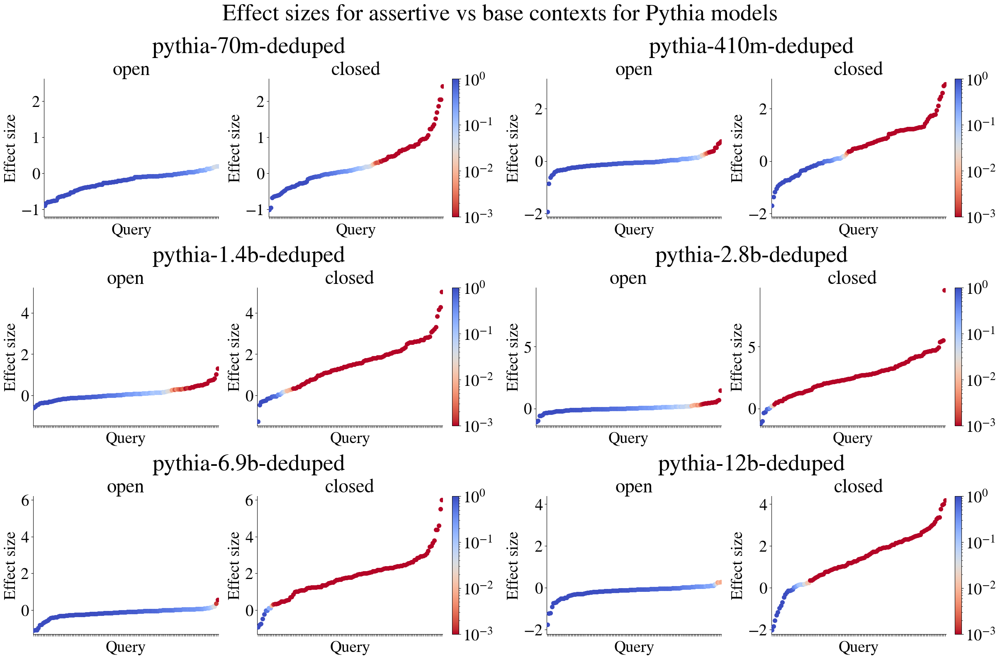

In [30]:
(
    assertive_open_results_per_model,
    assertive_closed_results_per_model,
    assertive_test_results_per_model,
) = get_test_results_and_plot_per_model(
    mean_pscore_dfs_per_model,
    group1="assertive",
    group2="base",
    score_col="mean_p_score",
    type_col="context_types",
    alternative="greater",
    permutations=10000,
    title="Effect sizes for assertive vs base contexts for Pythia models",
    save_path=os.path.join(
        analysis_dir, "plot_pscore_base_vs_assertive_all_models.pdf"
    ),
    cm=cm,
)

/cluster/home/kevidu/.local/lib/python3.10/site-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/cluster/home/kevidu/.local/lib/python3.10/site-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)


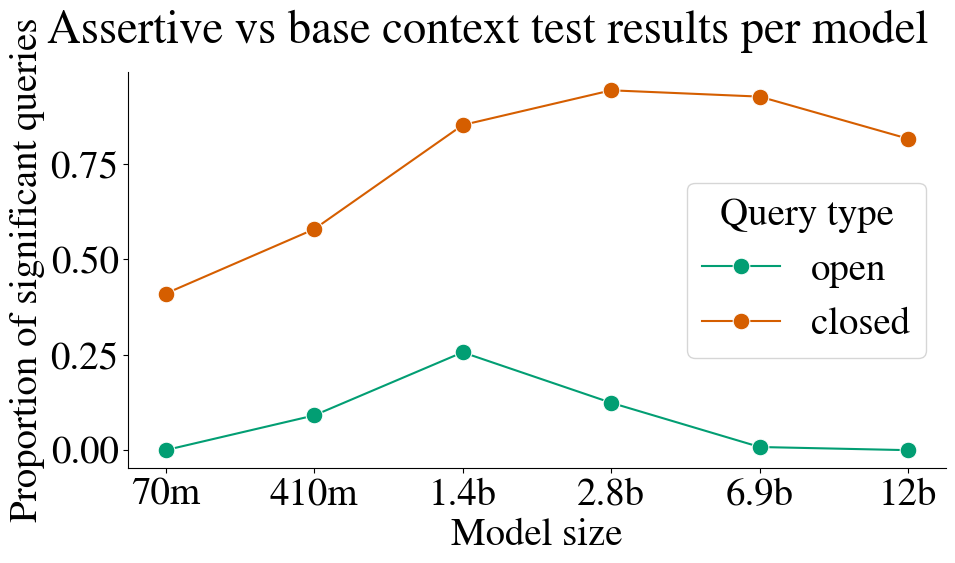

In [31]:
sig_assertive_test_results_per_model_df = (
    convert_test_results_dict_to_sig_proportion_df(assertive_test_results_per_model)
)
plot_prop_queries_significant_per_model(
    sig_assertive_test_results_per_model_df,
    title="Assertive vs base context test results per model",
    save_path=os.path.join(
        analysis_dir, "plot_assertive_vs_base_pval_proportion_all_models.pdf"
    ),
    palette=open_closed_colormap,
)

/cluster/home/kevidu/.local/lib/python3.10/site-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/cluster/home/kevidu/.local/lib/python3.10/site-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)


<Axes: xlabel='Model size', ylabel='Effect size'>

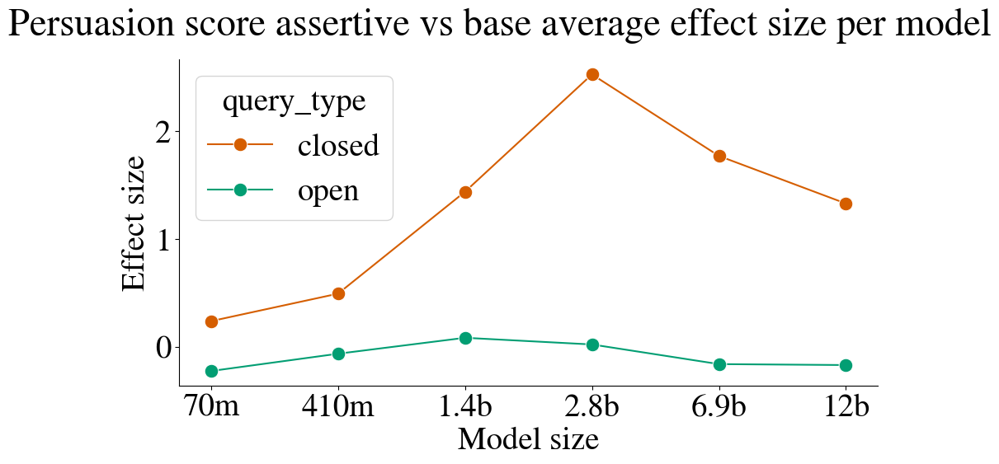

In [32]:
assertive_mean_effect_sz_df = build_mean_effect_sz_df(
    assertive_open_results_per_model, assertive_closed_results_per_model
)
plot_effect_sz_per_model(
    assertive_mean_effect_sz_df,
    title="Persuasion score assertive vs base average effect size per model",
    save_path=os.path.join(
        analysis_dir, "plot_pscore_effect_sz_assertive_base_all_models.pdf"
    ),
    palette=open_closed_colormap,
)

### Negation vs base

MODEL ID: EleutherAI/pythia-70m-deduped


100%|██████████| 123/123 [00:12<00:00,  9.73it/s]
/cluster/home/kevidu/.local/lib/python3.10/site-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/cluster/home/kevidu/.local/lib/python3.10/site-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)


{
  "open": {
    "count": {
      "significant (two-sided)": 106,
      "insignificant": 16
    },
    "proportion": {
      "significant (two-sided)": 0.8688524590163934,
      "insignificant": 0.13114754098360656
    }
  },
  "closed": {
    "count": {
      "significant (two-sided)": 121,
      "insignificant": 1
    },
    "proportion": {
      "significant (two-sided)": 0.9918032786885246,
      "insignificant": 0.00819672131147541
    }
  }
}
MODEL ID: EleutherAI/pythia-410m-deduped


100%|██████████| 122/122 [00:12<00:00,  9.46it/s]
/cluster/home/kevidu/.local/lib/python3.10/site-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/cluster/home/kevidu/.local/lib/python3.10/site-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)


{
  "open": {
    "count": {
      "significant (two-sided)": 67,
      "insignificant": 54
    },
    "proportion": {
      "significant (two-sided)": 0.5537190082644629,
      "insignificant": 0.4462809917355372
    }
  },
  "closed": {
    "count": {
      "significant (two-sided)": 102,
      "insignificant": 19
    },
    "proportion": {
      "significant (two-sided)": 0.8429752066115702,
      "insignificant": 0.15702479338842976
    }
  }
}
MODEL ID: EleutherAI/pythia-1.4b-deduped


100%|██████████| 122/122 [00:12<00:00,  9.99it/s]
/cluster/home/kevidu/.local/lib/python3.10/site-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/cluster/home/kevidu/.local/lib/python3.10/site-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)


{
  "open": {
    "count": {
      "significant (two-sided)": 86,
      "insignificant": 35
    },
    "proportion": {
      "significant (two-sided)": 0.7107438016528925,
      "insignificant": 0.2892561983471074
    }
  },
  "closed": {
    "count": {
      "significant (two-sided)": 102,
      "insignificant": 19
    },
    "proportion": {
      "significant (two-sided)": 0.8429752066115702,
      "insignificant": 0.15702479338842976
    }
  }
}
MODEL ID: EleutherAI/pythia-2.8b-deduped


100%|██████████| 122/122 [00:12<00:00, 10.00it/s]
/cluster/home/kevidu/.local/lib/python3.10/site-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/cluster/home/kevidu/.local/lib/python3.10/site-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)


{
  "open": {
    "count": {
      "significant (two-sided)": 85,
      "insignificant": 36
    },
    "proportion": {
      "significant (two-sided)": 0.7024793388429752,
      "insignificant": 0.2975206611570248
    }
  },
  "closed": {
    "count": {
      "significant (two-sided)": 117,
      "insignificant": 4
    },
    "proportion": {
      "significant (two-sided)": 0.9669421487603306,
      "insignificant": 0.03305785123966942
    }
  }
}
MODEL ID: EleutherAI/pythia-6.9b-deduped


100%|██████████| 122/122 [00:11<00:00, 10.35it/s]
/cluster/home/kevidu/.local/lib/python3.10/site-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/cluster/home/kevidu/.local/lib/python3.10/site-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)


{
  "open": {
    "count": {
      "significant (two-sided)": 88,
      "insignificant": 33
    },
    "proportion": {
      "significant (two-sided)": 0.7272727272727273,
      "insignificant": 0.2727272727272727
    }
  },
  "closed": {
    "count": {
      "significant (two-sided)": 105,
      "insignificant": 16
    },
    "proportion": {
      "significant (two-sided)": 0.8677685950413223,
      "insignificant": 0.1322314049586777
    }
  }
}
MODEL ID: EleutherAI/pythia-12b-deduped


100%|██████████| 120/120 [00:11<00:00, 10.41it/s]
/cluster/home/kevidu/.local/lib/python3.10/site-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/cluster/home/kevidu/.local/lib/python3.10/site-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)


{
  "open": {
    "count": {
      "significant (two-sided)": 71,
      "insignificant": 48
    },
    "proportion": {
      "significant (two-sided)": 0.5966386554621849,
      "insignificant": 0.40336134453781514
    }
  },
  "closed": {
    "count": {
      "significant (two-sided)": 99,
      "insignificant": 20
    },
    "proportion": {
      "significant (two-sided)": 0.8319327731092437,
      "insignificant": 0.16806722689075632
    }
  }
}


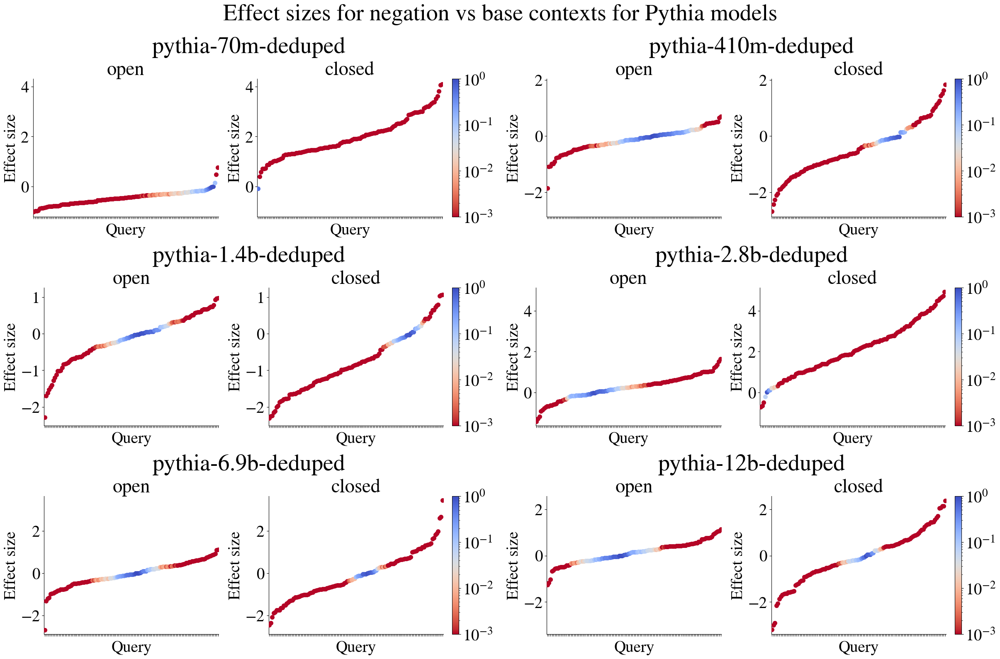

In [33]:
(
    negation_open_results_per_model,
    negation_closed_results_per_model,
    negation_test_results_per_model,
) = get_test_results_and_plot_per_model(
    mean_pscore_dfs_per_model,
    group1="negation",
    group2="base",
    score_col="mean_p_score",
    type_col="context_types",
    alternative="two-sided",
    permutations=10000,
    title="Effect sizes for negation vs base contexts for Pythia models",
    save_path=os.path.join(analysis_dir, "plot_pscore_negation_vs_base_all_models.pdf"),
    cm=cm,
)

/cluster/home/kevidu/.local/lib/python3.10/site-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/cluster/home/kevidu/.local/lib/python3.10/site-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/cluster/home/kevidu/.local/lib/python3.10/site-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/cluster/home/kevidu/.local/lib

<Axes: xlabel='Model size', ylabel='Effect size'>

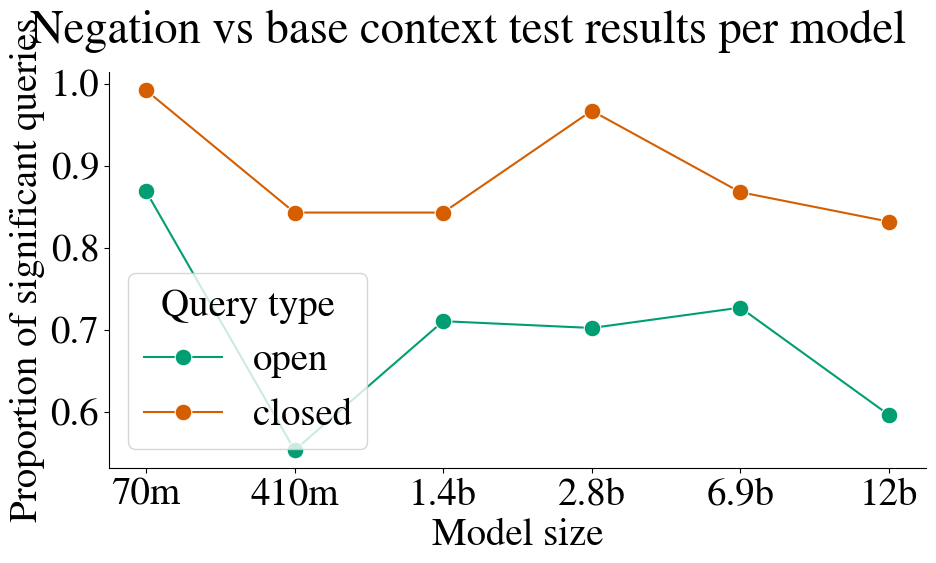

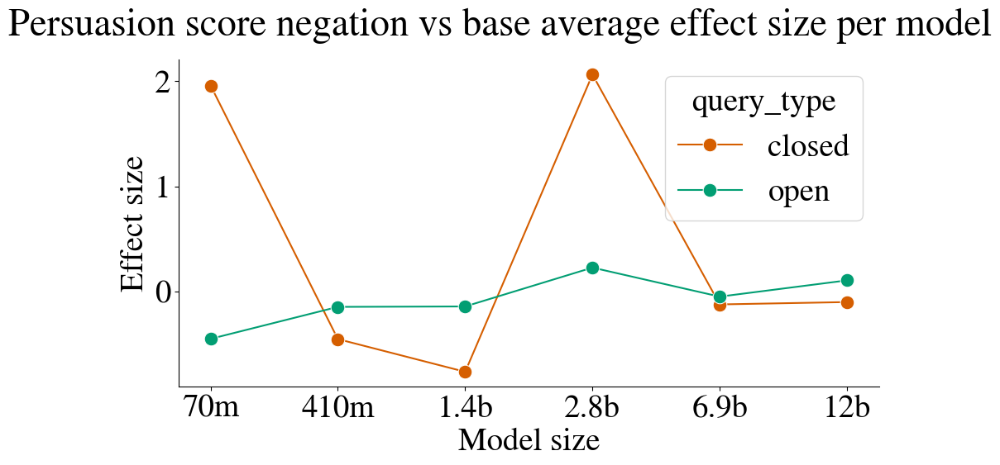

In [34]:
negation_test_results_per_model_df = convert_test_results_dict_to_sig_proportion_df(
    negation_test_results_per_model
)
plot_prop_queries_significant_per_model(
    negation_test_results_per_model_df,
    title="Negation vs base context test results per model",
    save_path=os.path.join(
        analysis_dir, "plot_negation_vs_base_pval_proportion_all_models.pdf"
    ),
    palette=open_closed_colormap,
)

negation_mean_effect_sz_df = build_mean_effect_sz_df(
    negation_open_results_per_model, negation_closed_results_per_model
)
plot_effect_sz_per_model(
    negation_mean_effect_sz_df,
    title="Persuasion score negation vs base average effect size per model",
    save_path=os.path.join(
        analysis_dir, "plot_pscore_effect_sz_negation_base_all_models.pdf"
    ),
    palette=open_closed_colormap,
)

### Relevant vs irrelevant

In [35]:
# Process each df in exploded_df_all_per_model to be the mean across all contexts for that entity
mean_pscore_relevant_dfs_per_model = []
for model_id, df_m in exploded_df_all_per_model:
    p_score_per_context_type = (
        df_m.groupby(
            [
                "QUERY_ID",
                "query_form",
                "entity",
                "query_type",
                "context_relevant_vs_irrelevant",
            ]
        )
        .agg(mean_p_score=("persuasion_scores_kl", "mean"))
        .reset_index()
    )
    mean_pscore_relevant_dfs_per_model.append((model_id, p_score_per_context_type))

MODEL ID: EleutherAI/pythia-70m-deduped


100%|██████████| 123/123 [00:12<00:00,  9.74it/s]
/cluster/home/kevidu/.local/lib/python3.10/site-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/cluster/home/kevidu/.local/lib/python3.10/site-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)


{
  "open": {
    "count": {
      "significant (greater)": 123,
      "insignificant": 0
    },
    "proportion": {
      "significant (greater)": 1.0,
      "insignificant": 0.0
    }
  },
  "closed": {
    "count": {
      "significant (greater)": 123,
      "insignificant": 0
    },
    "proportion": {
      "significant (greater)": 1.0,
      "insignificant": 0.0
    }
  }
}
MODEL ID: EleutherAI/pythia-410m-deduped


100%|██████████| 122/122 [00:13<00:00,  8.89it/s]
/cluster/home/kevidu/.local/lib/python3.10/site-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/cluster/home/kevidu/.local/lib/python3.10/site-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)


{
  "open": {
    "count": {
      "significant (greater)": 122,
      "insignificant": 0
    },
    "proportion": {
      "significant (greater)": 1.0,
      "insignificant": 0.0
    }
  },
  "closed": {
    "count": {
      "significant (greater)": 121,
      "insignificant": 1
    },
    "proportion": {
      "significant (greater)": 0.9918032786885246,
      "insignificant": 0.00819672131147541
    }
  }
}
MODEL ID: EleutherAI/pythia-1.4b-deduped


100%|██████████| 122/122 [00:12<00:00,  9.43it/s]
/cluster/home/kevidu/.local/lib/python3.10/site-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/cluster/home/kevidu/.local/lib/python3.10/site-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)


{
  "open": {
    "count": {
      "significant (greater)": 121,
      "insignificant": 1
    },
    "proportion": {
      "significant (greater)": 0.9918032786885246,
      "insignificant": 0.00819672131147541
    }
  },
  "closed": {
    "count": {
      "significant (greater)": 115,
      "insignificant": 7
    },
    "proportion": {
      "significant (greater)": 0.9426229508196722,
      "insignificant": 0.05737704918032787
    }
  }
}
MODEL ID: EleutherAI/pythia-2.8b-deduped


100%|██████████| 122/122 [00:14<00:00,  8.14it/s]
/cluster/home/kevidu/.local/lib/python3.10/site-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/cluster/home/kevidu/.local/lib/python3.10/site-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)


{
  "open": {
    "count": {
      "significant (greater)": 116,
      "insignificant": 6
    },
    "proportion": {
      "significant (greater)": 0.9508196721311475,
      "insignificant": 0.04918032786885246
    }
  },
  "closed": {
    "count": {
      "significant (greater)": 101,
      "insignificant": 21
    },
    "proportion": {
      "significant (greater)": 0.8278688524590164,
      "insignificant": 0.1721311475409836
    }
  }
}
MODEL ID: EleutherAI/pythia-6.9b-deduped


100%|██████████| 122/122 [00:16<00:00,  7.56it/s]
/cluster/home/kevidu/.local/lib/python3.10/site-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/cluster/home/kevidu/.local/lib/python3.10/site-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)


{
  "open": {
    "count": {
      "significant (greater)": 119,
      "insignificant": 3
    },
    "proportion": {
      "significant (greater)": 0.9754098360655737,
      "insignificant": 0.02459016393442623
    }
  },
  "closed": {
    "count": {
      "significant (greater)": 122,
      "insignificant": 0
    },
    "proportion": {
      "significant (greater)": 1.0,
      "insignificant": 0.0
    }
  }
}
MODEL ID: EleutherAI/pythia-12b-deduped


100%|██████████| 120/120 [00:12<00:00,  9.56it/s]
/cluster/home/kevidu/.local/lib/python3.10/site-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/cluster/home/kevidu/.local/lib/python3.10/site-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)


{
  "open": {
    "count": {
      "significant (greater)": 117,
      "insignificant": 3
    },
    "proportion": {
      "significant (greater)": 0.975,
      "insignificant": 0.025
    }
  },
  "closed": {
    "count": {
      "significant (greater)": 118,
      "insignificant": 2
    },
    "proportion": {
      "significant (greater)": 0.9833333333333333,
      "insignificant": 0.016666666666666666
    }
  }
}


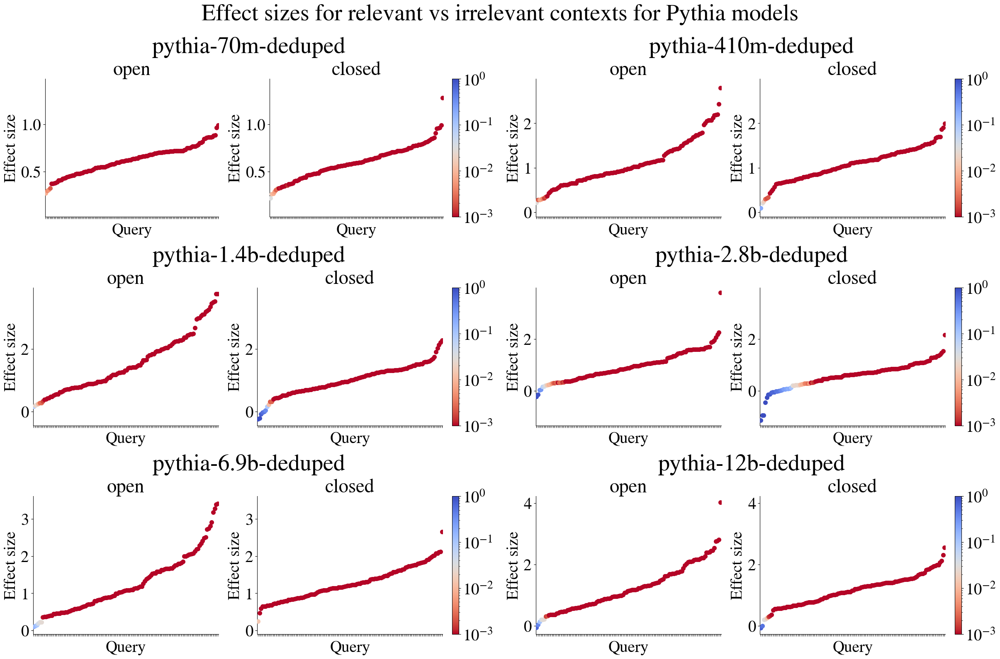

In [36]:
(
    rel_vs_irrel_open_results_per_model,
    rel_vs_irrel_closed_results_per_model,
    rel_vs_irrel_test_results_per_model,
) = get_test_results_and_plot_per_model(
    mean_pscore_relevant_dfs_per_model,
    group1="relevant",
    group2="irrelevant",
    score_col="mean_p_score",
    type_col="context_relevant_vs_irrelevant",
    alternative="greater",
    permutations=10000,
    title="Effect sizes for relevant vs irrelevant contexts for Pythia models",
    save_path=os.path.join(
        analysis_dir, "plot_pscore_relevant_vs_irrelevant_all_models.pdf"
    ),
    cm=cm,
)

/cluster/home/kevidu/.local/lib/python3.10/site-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/cluster/home/kevidu/.local/lib/python3.10/site-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/cluster/home/kevidu/.local/lib/python3.10/site-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/cluster/home/kevidu/.local/lib

<Axes: xlabel='Model size', ylabel='Effect size'>

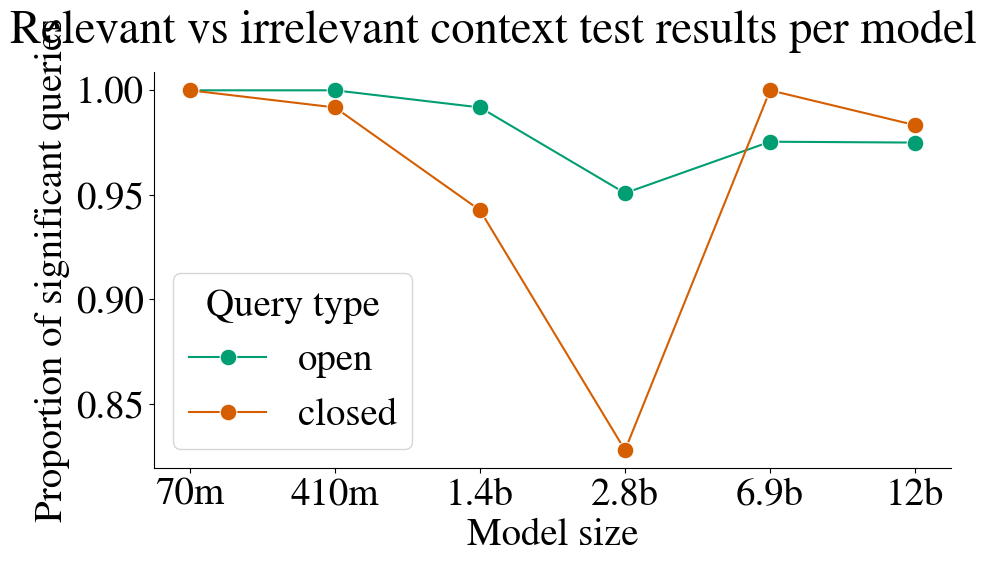

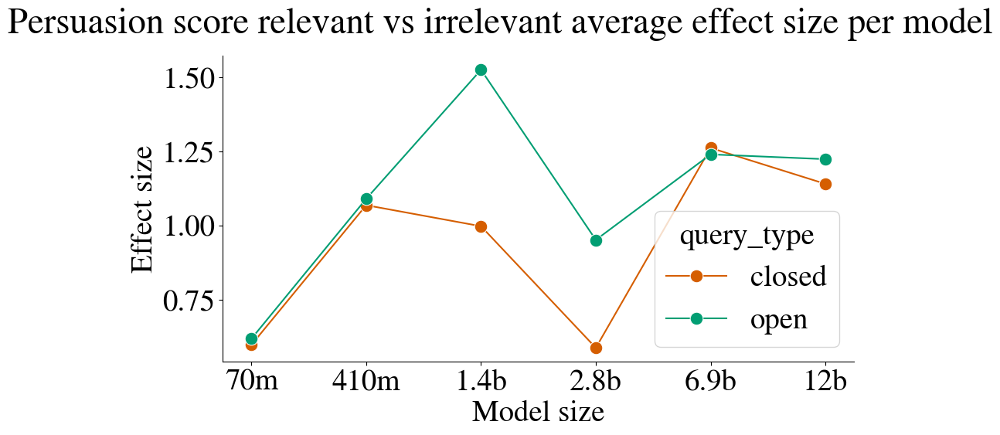

In [37]:
rel_vs_irrel_test_results_per_model_df = convert_test_results_dict_to_sig_proportion_df(
    rel_vs_irrel_test_results_per_model
)
plot_prop_queries_significant_per_model(
    rel_vs_irrel_test_results_per_model_df,
    title="Relevant vs irrelevant context test results per model",
    save_path=os.path.join(
        analysis_dir, "plot_relevant_vs_irrelevant_pval_proportion_all_models.pdf"
    ),
    palette=open_closed_colormap,
)

rel_vs_irrel_mean_effect_sz_df = build_mean_effect_sz_df(
    rel_vs_irrel_open_results_per_model, rel_vs_irrel_closed_results_per_model
)
plot_effect_sz_per_model(
    rel_vs_irrel_mean_effect_sz_df,
    title="Persuasion score relevant vs irrelevant average effect size per model",
    save_path=os.path.join(
        analysis_dir, "plot_pscore_effect_sz_relevant_irrelevant_all_models.pdf"
    ),
    palette=open_closed_colormap,
)

### Aggregated plots

In [38]:
sig_sus_test_results_per_model_df["Comparison"] = "Familiar vs unfamiliar entities"
sig_assertive_test_results_per_model_df["Comparison"] = "Assertive vs base contexts"
negation_test_results_per_model_df["Comparison"] = "Negation vs base contexts"
rel_vs_irrel_test_results_per_model_df["Comparison"] = "Relevant vs irrelevant contexts"
all_tests_combined_df = pd.concat(
    [
        sig_sus_test_results_per_model_df,
        sig_assertive_test_results_per_model_df,
        negation_test_results_per_model_df,
        rel_vs_irrel_test_results_per_model_df,
    ]
)
all_tests_combined_df

,model_name,Model size,Model size count,Query type,metric_type,significance,value,Comparison
2,EleutherAI/pythia-70m-deduped,70m,7.000000e+07,open,proportion,significant (greater),0.000000,Familiar vs unfamiliar entities
6,EleutherAI/pythia-70m-deduped,70m,7.000000e+07,closed,proportion,significant (greater),0.170732,Familiar vs unfamiliar entities
14,EleutherAI/pythia-410m-deduped,410m,4.100000e+08,closed,proportion,significant (greater),0.278689,Familiar vs unfamiliar entities
10,EleutherAI/pythia-410m-deduped,410m,4.100000e+08,open,proportion,significant (greater),0.213115,Familiar vs unfamiliar entities
22,EleutherAI/pythia-1.4b-deduped,1.4b,1.400000e+09,closed,proportion,significant (greater),0.450820,Familiar vs unfamiliar entities
18,EleutherAI/pythia-1.4b-deduped,1.4b,1.400000e+09,open,proportion,significant (greater),0.385246,Familiar vs unfamiliar entities
26,EleutherAI/pythia-2.8b-deduped,2.8b,2.800000e+09,open,proportion,significant (greater),0.401639,Familiar vs unfamiliar entities
30,EleutherAI/pythia-2.8b-deduped,2.8b,2.800000e+09,closed,proportion,significant (greater),0.319672,Familiar vs unfamiliar entities
38,EleutherAI/pythia-6.9b-deduped,6.9b,6.900000e+09,closed,proportion,significant (greater),0.409836,Familiar vs unfamiliar entities
34,EleutherAI/pythia-6.9b-deduped,6.9b,6.900000e+09,open,proportion,significant (greater),0.467213,Familiar vs unfamiliar entities


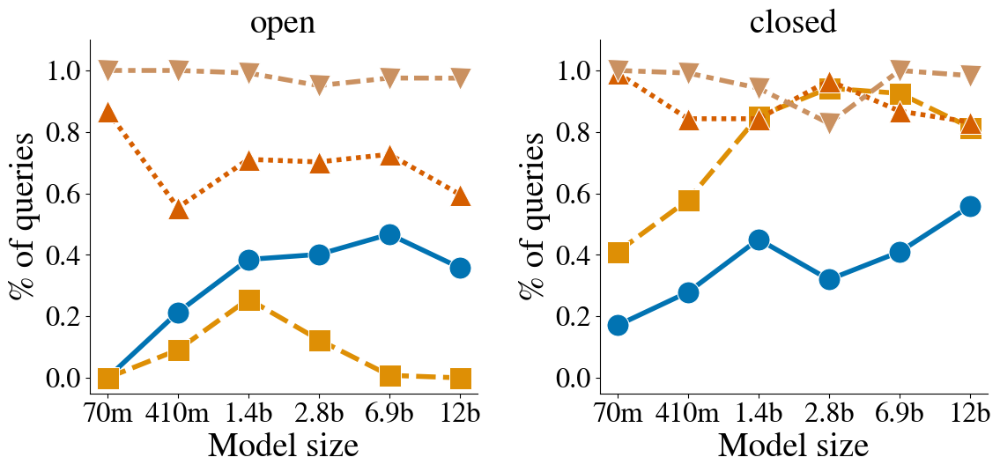

In [39]:
# fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(16, 7))
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(12, 6))

for i, qt in enumerate(
    sorted(all_tests_combined_df["Query type"].unique(), reverse=True)
):
    ax = axes[i]
    sns.lineplot(
        data=all_tests_combined_df[all_tests_combined_df["Query type"] == qt],
        x="Model size",
        y="value",
        hue="Comparison",
        style="Comparison",
        markers=["o", "s", "^", "v"],
        markersize=18,
        linewidth=4,
        ax=ax,
        legend=None,
        # legend=None if i == 0 else True,
        palette=comparison_colormap,
    )
    ax.set_title(qt, size="medium")
    ax.set_xlabel("Model size", size="medium")
    ax.set_ylabel("% of queries", size="medium")
    ax.set_ylim(-0.05, 1.1)
    ax.tick_params(axis="both", which="major", labelsize="small")


# fig.suptitle(
#     "% of queries with significant results",
#     # "% of queries with significant results for different comparisons and models",
#     y=0.92,
# )
plt.tight_layout()

plot_name = f"plot_comparisons_prop_sig_models_all"
save_path = os.path.join(analysis_dir, f"{plot_name}.pdf")
fig.savefig(save_path, bbox_inches="tight")

This plot indicates the proportion of queries for which (bronze down triangles) relevant contexts are significantly more persuasive than irrelevant contexts, (blue circles) unfamiliar entities are significantly more susceptible than familiar entities, (yellow squares) assertive contexts are significantly more persuasive than base contexts, and (orange triangles) negation contexts are significantly more persuasive than base contexts.

In [40]:
sus_mean_effect_sz_df["Comparison"] = "Familiar vs unfamiliar entities"
assertive_mean_effect_sz_df["Comparison"] = "Assertive vs base contexts"
negation_mean_effect_sz_df["Comparison"] = "Negation vs base contexts"
rel_vs_irrel_mean_effect_sz_df["Comparison"] = "Relevant vs irrelevant contexts"
all_effect_szs_combined_df = pd.concat(
    [
        sus_mean_effect_sz_df,
        assertive_mean_effect_sz_df,
        negation_mean_effect_sz_df,
        rel_vs_irrel_mean_effect_sz_df,
    ]
)
all_effect_szs_combined_df

,model_name,Model size,query_type,mean_effect_sz,Model size count,Comparison
10,EleutherAI/pythia-70m-deduped,70m,closed,0.073828,7.000000e+07,Familiar vs unfamiliar entities
11,EleutherAI/pythia-70m-deduped,70m,open,0.039495,7.000000e+07,Familiar vs unfamiliar entities
6,EleutherAI/pythia-410m-deduped,410m,closed,0.244951,4.100000e+08,Familiar vs unfamiliar entities
7,EleutherAI/pythia-410m-deduped,410m,open,0.236352,4.100000e+08,Familiar vs unfamiliar entities
0,EleutherAI/pythia-1.4b-deduped,1.4b,closed,0.292160,1.400000e+09,Familiar vs unfamiliar entities
1,EleutherAI/pythia-1.4b-deduped,1.4b,open,0.420033,1.400000e+09,Familiar vs unfamiliar entities
4,EleutherAI/pythia-2.8b-deduped,2.8b,closed,0.146606,2.800000e+09,Familiar vs unfamiliar entities
5,EleutherAI/pythia-2.8b-deduped,2.8b,open,0.360225,2.800000e+09,Familiar vs unfamiliar entities
8,EleutherAI/pythia-6.9b-deduped,6.9b,closed,0.242004,6.900000e+09,Familiar vs unfamiliar entities
9,EleutherAI/pythia-6.9b-deduped,6.9b,open,0.402046,6.900000e+09,Familiar vs unfamiliar entities


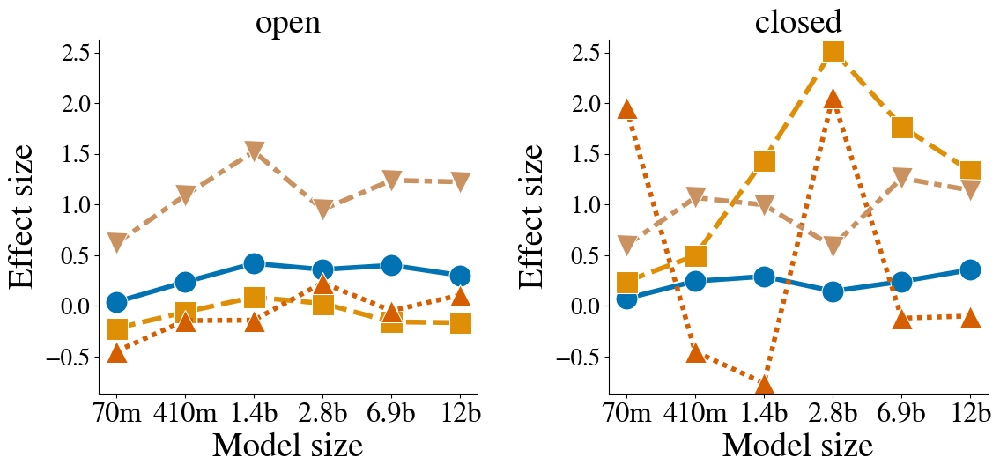

In [41]:
# fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(14, 7))
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(12, 6))
for i, qt in enumerate(
    sorted(all_effect_szs_combined_df["query_type"].unique(), reverse=True)
):
    ax = axes[i]
    sns.lineplot(
        data=all_effect_szs_combined_df[all_effect_szs_combined_df["query_type"] == qt],
        x="Model size",
        y="mean_effect_sz",
        hue="Comparison",
        style="Comparison",
        markers=["o", "s", "^", "v"],
        markersize=18,  # 16
        linewidth=4,  # 3
        ax=ax,
        legend=None,
        # legend=None if i == 0 else True,
        palette=comparison_colormap,
    )
    ax.set_title(qt, size="medium")
    ax.set_xlabel("Model size", size="medium")
    ax.set_ylabel("Effect size", size="medium")
    ax.tick_params(axis="x", which="major", labelsize="small")
    ax.tick_params(axis="y", which="major", labelsize="x-small")
    ax.set_ylim(
        all_effect_szs_combined_df["mean_effect_sz"].min() - 0.1,
        all_effect_szs_combined_df["mean_effect_sz"].max() + 0.1,
    )

# fig.suptitle(
#     " ",
#     # "Mean effect size for different comparisons and models",
#     y=0.92,
# )
plt.tight_layout()
# plt.subplots_adjust(right=0.75)  # Adjust this value based on your figure size

plot_name = f"plot_comparisons_effect_szs_models_all"
save_path = os.path.join(analysis_dir, f"{plot_name}.pdf")
fig.savefig(save_path, bbox_inches="tight")

In [42]:
print(
    json.dumps(
        {k: matplotlib.colors.rgb2hex(v) for k, v in comparison_colormap.items()},
        indent=2,
    )
)

{
  "Familiar vs unfamiliar entities": "#0173b2",
  "Assertive vs base contexts": "#de8f05",
  "Negation vs base contexts": "#d55e00",
  "Relevant vs irrelevant contexts": "#ca9161"
}


This plot indicates, as measured by average effect size over queries, the degree to which (bronze down triangles) relevant contexts are more persuasive than irrelevant contexts, (blue circles) unfamiliar entities are more susceptible than familiar entities, (yellow squares) assertive contexts are more persuasive than base contexts, and (orange triangles) negation contexts are more persuasive than base contexts.

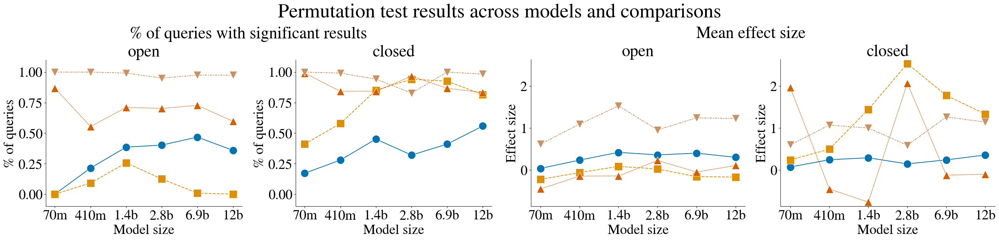

In [43]:
fig = plt.figure(constrained_layout=True, figsize=(28, 6))
subfigs = fig.subfigures(nrows=1, ncols=2)

axes = subfigs[0].subplots(nrows=1, ncols=2)
for i, qt in enumerate(
    sorted(all_tests_combined_df["Query type"].unique(), reverse=True)
):
    ax = axes[i]
    sns.lineplot(
        data=all_tests_combined_df[all_tests_combined_df["Query type"] == qt],
        x="Model size",
        y="value",
        hue="Comparison",
        style="Comparison",
        markers=["o", "s", "^", "v"],
        markersize=16,
        ax=ax,
        legend=None,
        # legend=None if i == 0 else True,
        palette=comparison_colormap,
    )
    ax.set_title(qt)
    ax.set_xlabel("Model size")
    ax.set_ylabel("% of queries")
    ax.set_ylim(-0.1, 1.1)

subfigs[0].suptitle(
    "% of queries with significant results",
    # size="medium",
)

axes = subfigs[1].subplots(nrows=1, ncols=2)
for i, qt in enumerate(
    sorted(all_effect_szs_combined_df["query_type"].unique(), reverse=True)
):
    ax = axes[i]
    sns.lineplot(
        data=all_effect_szs_combined_df[all_effect_szs_combined_df["query_type"] == qt],
        x="Model size",
        y="mean_effect_sz",
        hue="Comparison",
        style="Comparison",
        markers=["o", "s", "^", "v"],
        markersize=16,
        ax=ax,
        legend=None,
        # legend=None if i == 0 else True,
        palette=comparison_colormap,
    )
    ax.set_title(qt)
    ax.set_xlabel("Model size")
    ax.set_ylabel("Effect size")
    ax.set_ylim(
        all_effect_szs_combined_df["mean_effect_sz"].min() - 0.1,
        all_effect_szs_combined_df["mean_effect_sz"].max() + 0.1,
    )

subfigs[1].suptitle(
    "Mean effect size",
    # size="medium",
)

fig.suptitle(
    "Permutation test results across models and comparisons",
    y=1.1,
    size="x-large",
)

plot_name = f"plot_prop_sig_and_effect_szs_comparisons_models_all"
save_path = os.path.join(analysis_dir, f"{plot_name}.pdf")
fig.savefig(save_path, bbox_inches="tight")

In [44]:
for (_, ef_df), (_, prop_df) in zip(
    all_effect_szs_combined_df.groupby(["query_type", "Comparison"]),
    all_tests_combined_df.groupby(["Query type", "Comparison"]),
):
    ef_df = ef_df.rename(
        columns={"query_type": "Query type", "mean_effect_sz": "Mean effect size"}
    )
    ef_df_full = ef_df.copy()

    ef_df = ef_df[
        [
            "Model size",
            # "Comparison",
            # "Query type",
            "Mean effect size",
        ]
    ]
    # prop_df = prop_df.rename(columns={"value": "% relations with significant result"})
    prop_df = prop_df.rename(columns={"value": "% relations w/ sig. result"})
    prop_df = prop_df[prop_df["significance"] != "insignificant"][
        [
            "Model size",
            # "Comparison",
            # "Query type",
            "% relations w/ sig. result",
        ]
    ]
    print(
        f"{ef_df_full['Comparison'].iloc[0]}, {ef_df_full['Query type'].iloc[0]} queries"
    )
    print(prop_df.merge(ef_df).to_markdown(index=False, floatfmt=".2f"))
    # print(
    #     .to_markdown(index=False)
    # )
    print("\n\n")
    # print(prop_df)

Assertive vs base contexts, closed queries
| Model size   |   % relations w/ sig. result |   Mean effect size |
|:-------------|-----------------------------:|-------------------:|
| 70m          |                         0.41 |               0.24 |
| 410m         |                         0.58 |               0.50 |
| 1.4b         |                         0.85 |               1.44 |
| 2.8b         |                         0.94 |               2.53 |
| 6.9b         |                         0.93 |               1.77 |
| 12b          |                         0.82 |               1.33 |



Familiar vs unfamiliar entities, closed queries
| Model size   |   % relations w/ sig. result |   Mean effect size |
|:-------------|-----------------------------:|-------------------:|
| 70m          |                         0.17 |               0.07 |
| 410m         |                         0.28 |               0.24 |
| 1.4b         |                         0.45 |               0.29 |
| 2.8b   